In [1]:
%%HTML
<script src="require.js"></script>

#### Table of Contents:
* [Introduction](#intro)
* [Stationarity, Diffing and Seasonality](#topic2)
* [Forecasting](#topic3)
* [Regression and Trading](#topic4)
* [Monte Carlo Simluations](#topic5)
* [Decompositions](#topic6)
* [ARIMA](#topic7)
* Extra Topics
    * [SARIMA](#extra) 
    * [Prophet](#extra2)  
* [Results & Conclusions](#conclusions)

In [3]:
import os
import random
import numpy as np
import math
import pandas as pd
import yfinance as yf
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import plotly.express as px
from datetime import datetime
import matplotlib.pyplot as plt
import statsmodels.api as sm
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.ar_model import AutoReg
from statsmodels.tsa.seasonal import STL
from statsmodels.tsa.statespace.sarimax import SARIMAX
from tqdm import tqdm_notebook
from itertools import product
from meteostat import Stations, Monthly
import quandl as qd
#import prophet as Prophet
import warnings

warnings.filterwarnings("ignore")
qd.ApiConfig.api_key = "qyPYHy1SCn-eUgJVDzD2"
pd.options.mode.chained_assignment = None  

# Introduction <a class="anchor" id="intro"></a>

The below project demonstrates a variety of econometric analysis and forecasting models utilizing real-world data. This includes various tests to help inform whether a model is a good fit for a particular dataset, or what decompositions must be performed to make the dataset amenable to the model. Datasets lean heavily toward finance and economics (including an incredible [US stock index](#topic4) assembled by Edward McQuarrie in the past few years, going back to the time of George Washington). 

Conclusions and model results are provided throughout each topic, with overarching themes summarized at the end.

All code is either original, modified from the course lectures, or credited when taken from the work of others.

### A Note on Plotly interactive graphs
Plotly has been utilized instead of matplotlib for visualizations which are particularly dense or long-ranging. This allows the reader to hover over any portion of the plot to see a popup with the values. Readers are also invited to zoom in on any portion of a Plotly graph they may be interested in. This can be done by clicking and dragging the mouse over that area.

I highly recommend the reader **view this notebook in HTML format** to ensure full compatibility with the Plotly visualizations and large pandas table at the end. The PDF is included in the event the reader cannot view the HTML document. However, the PDF might cut off certain elements. 

The HTML export was tested as fully functional on the latest versions of Safari, Firefox and Chrome on macOS.

# 1. Stationarity, Diffing and Seasonality <a class="anchor" id="topic2"></a>

## Identifying Stationary Data

Stationary data generally must have a constant mean and variance. Therefore, one of the purest examples of stationary data is white noise, which is defined as having a mean of 0 and standard deviation of 1.

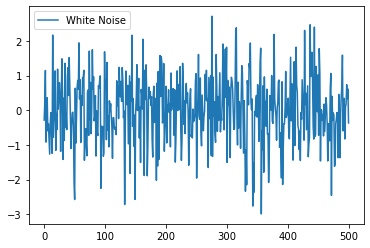

In [3]:
noise = np.random.normal(loc=0, scale=1, size=500)
noise_df = pd.DataFrame(noise, columns=['White Noise'])
noise_df.plot();

If there was any doubt, we could use the Augment Dickey-Fuller (ADF) test to confirm.

In [4]:
def adf_test(df, obs_col):
    adf_results = adfuller(df[obs_col])
    print('ADF Statistic: %f' % adf_results[0])
    print('p-value: %f' %adf_results[1])

adf_test(noise_df, 'White Noise')

ADF Statistic: -22.199698
p-value: 0.000000


The null hypothesis in this case is that the time series has a unit root, which would mean it is not stationary. Since p here is 0, we reject the null hypothesis and conclude this data is stationary. Of course, this is generated data - in the real world we typically don't see a p-value of 0! The reader will notice a few p-values throughout this report which appear to be 0, but this is only due to rounding. 

Later we will generate our own stationary series by decomposing real data.

## Identifying Non-Stationary Data

### Seasonal Data

Seasonal data is not considered to be stationary, even when it contains a constant mean and variance. The ADF test will not detect seasonality, so we cannot use it in this case.

As a new resident of Charlotte, North Carolina I have been keen to understand what kind of weather I'm in for. I will use the excellent meteostat library for this purpose. 

The plot below shows temperature patterns have been stable, with a mean annual temperature around 60 degrees Fahrenheit. The hottest monthly average is around 80 while the coldest is around 40. Not bad!

Since I'm not used to thinking of temperates as monthly averages, however, I've also plotted the temperates in Madison, Wisconsin where I grew up. As you'll see, Charlotte is a nice improvement!

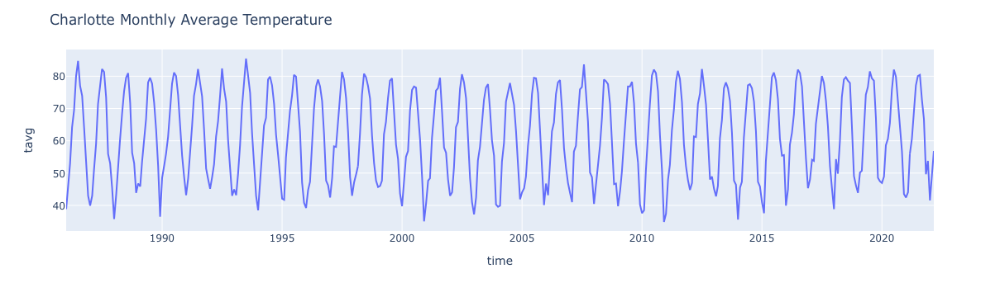

In [5]:
# Return weather stations near the Charlotte lat/long
stations = Stations()
stations = stations.nearby(35.2271, -80.8431)
station = stations.fetch().index[0]

# Fetch Charlotte weather
start = datetime(1986, 1, 1) # Data goes back to 1973 but contains gaps through 1985
end = datetime(2022, 12, 31)
weather = Monthly(station, start, end)
weather = weather.fetch()

# Clean up and plot
weather['tavg'] = weather['tavg'] * 1.8 + 32 # Convert to Fahrenheit
weather = weather.drop(columns=['tmin', 'tmax', 'prcp', 'wspd', 'pres', 'tsun'])
weather.name = 'weather'
fig = px.line(weather, x=weather.index, y='tavg', log_y=False)
fig.update_layout(title="Charlotte Monthly Average Temperature")

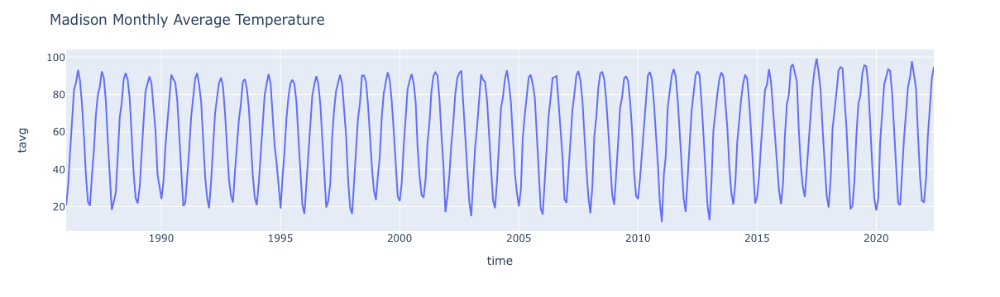

In [6]:
stations = Stations()
stations = stations.nearby(43.0722, 89.4008)
station = stations.fetch().index[0]

start = datetime(1986, 1, 1)
end = datetime(2022, 12, 31)
weather_mad = Monthly(station, start, end)
weather_mad = weather_mad.fetch()

weather_mad['tavg'] = weather_mad['tavg'] * 1.8 + 32 # Convert to Fahrenheit
weather_mad = weather_mad.drop(columns=['tmin', 'tmax', 'prcp', 'wspd', 'pres', 'tsun'])

fig = px.line(weather_mad, x=weather_mad.index, y='tavg', log_y=False)
fig.update_layout(title="Madison Monthly Average Temperature")

### Inflation 
Inflation is a hot topic right now, so let's take a look at its history. The Bureau of Labor Statistics provides over 100 years of monthly CPI data.

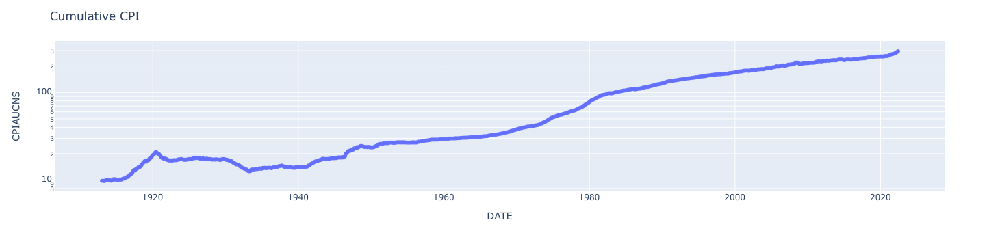

In [7]:
# CPI Monthly data
# Data obtained from https://fred.stlouisfed.org/series/CPIAUCNS

data = 'CPIAUCNS.csv'
cpi = pd.read_csv(data)
cpi.index = cpi['DATE']
cpi = cpi.drop(columns='DATE')

fig = px.scatter(cpi, x=cpi.index, y='CPIAUCNS', log_y=True)
fig.update_layout(title="Cumulative CPI")

The above chart shows inflation had different trends over time - including a long period of deflation beginning in 1921. (Remember what the US stock market did in the 1920s. Can you imagine a period where stocks were going to the moon while the purchasing power of the currency was simultaneously going up?)

For simplicity's sake, we'll examine 1981 and forward, as inflation appears to have been on a steady trend since then.

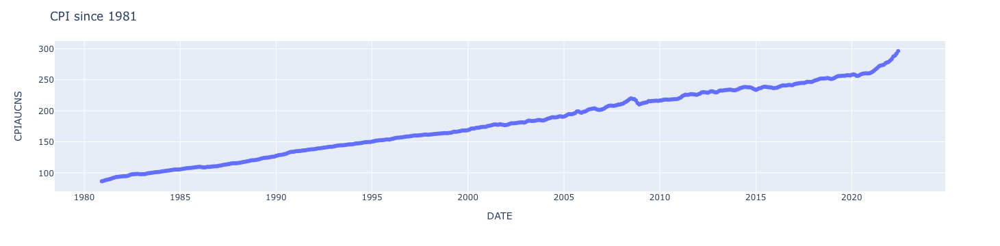

In [8]:
cpi = cpi['1980-12-01':]

fig = px.scatter(cpi, x=cpi.index, y='CPIAUCNS', log_y=False)
fig.update_layout(title="CPI since 1981")

### Differences

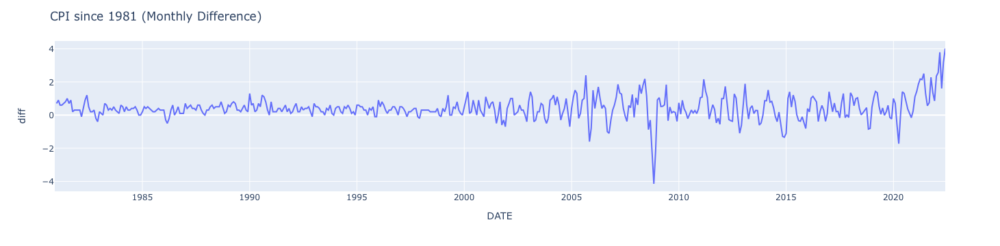

In [9]:
# Take the first difference

cpi['diff'] = cpi['CPIAUCNS'] - cpi['CPIAUCNS'].shift()

fig = px.line(cpi, x=cpi.index, y='diff', log_y=False)
fig.update_layout(title="CPI since 1981 (Monthly Difference)")

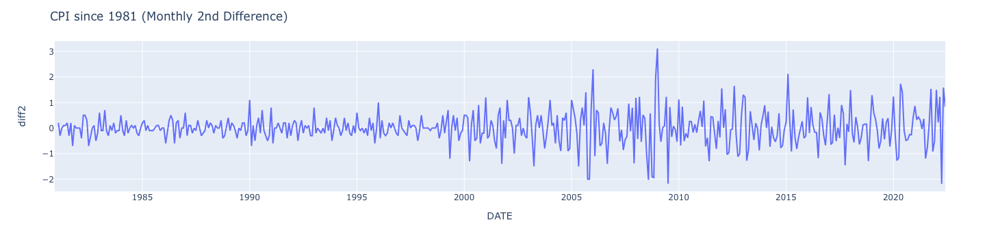

In [10]:
# Take the second difference

cpi['diff2'] = cpi['diff'] - cpi['diff'].shift()

fig = px.line(cpi, x=cpi.index, y='diff2', log_y=False)
fig.update_layout(title="CPI since 1981 (Monthly 2nd Difference)")

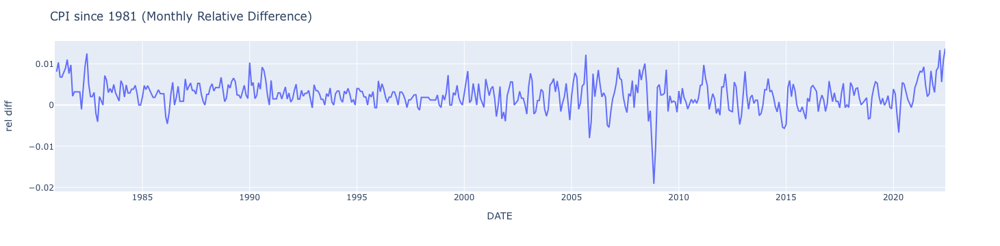

In [11]:
# Take the relative difference

cpi['rel diff'] = cpi['CPIAUCNS'] / cpi['CPIAUCNS'].shift() - 1

fig = px.line(cpi, x=cpi.index, y='rel diff', log_y=False)
fig.update_layout(title="CPI since 1981 (Monthly Relative Difference)")

The Difference and Relative Differnce plots are similar. However, the relative differences represent the data better. One with the relative difference can we see clearly that, for example, inflation was around 1% in the early 1980s, matching its current month-to-month levels. With the former plots this comparison was not possible.

All these plots are fairly flat, which could still indicate this is additive data. To test if it's multiplicative, let's plot the log differences.

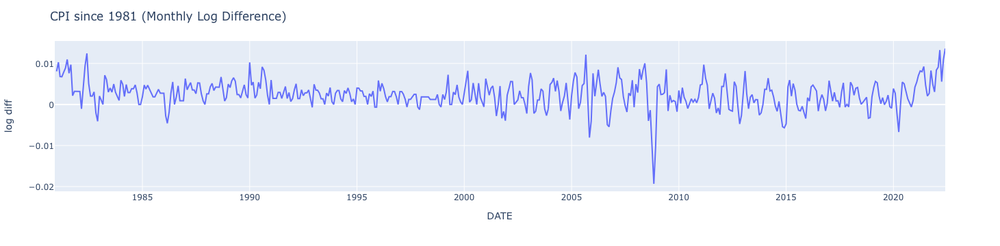

In [12]:
# Take the log differences

cpi['log diff'] = np.log(cpi['CPIAUCNS']) - np.log(cpi['CPIAUCNS'].shift())

fig = px.line(cpi, x=cpi.index, y='log diff', log_y=False)
fig.update_layout(title="CPI since 1981 (Monthly Log Difference)")

This looks identical to the relative difference plot above, which makes sense given that the mathematical operations are 2 ways of accomplishing the same transformation. They both indicate the data is multiplicative. 

We know that inflation increases by a percentage (in other words, the next inflation number is the result of multiplying the previous one by a certain amount), and so it is unsurprising to see the plot confirm it is multiplicative.

### US Stock Market
Previous research has suggested a degree of underlying trend to the real returns in the US stock markets. Let's take a look.

[*********************100%***********************]  1 of 1 completed


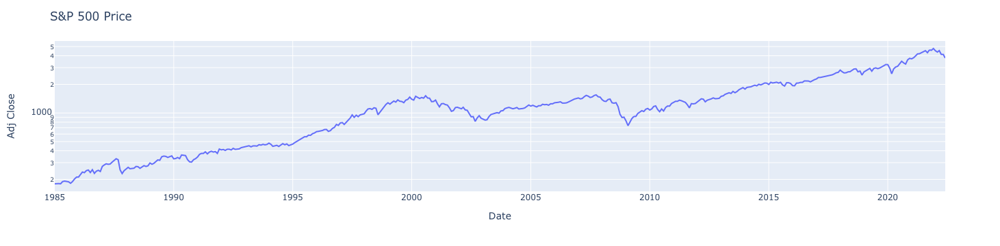

In [13]:
# SP500 monthly

sp500 = yf.download('^GSPC', end = '2022-06-01', interval='1mo')
sp500.index = pd.to_datetime(sp500.index)
sp500 = sp500.drop(columns=['Open', 'Close', 'High', 'Low', 'Volume'])
sp500.name = 'sp500'

fig = px.line(sp500, x=sp500.index, y='Adj Close', log_y=True)
fig.update_layout(title="S&P 500 Price")

As with inflation, the S&P500 price is a multiplicative time series. It increases not be fixed amount, but by a multiplicative factor. Otherwise, it would be a much worse long-term investment! 

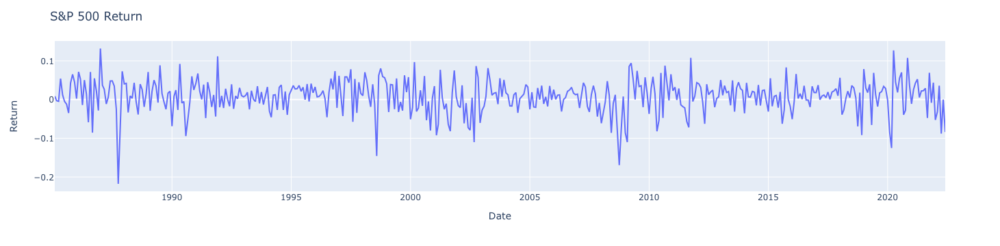

In [14]:
# Convert index prices to relative differences
sp500['Return'] = sp500['Adj Close'] / sp500['Adj Close'].shift(1) - 1
sp500 = sp500[1:]

fig = px.line(sp500, x=sp500.index, y='Return', log_y=False)
fig.update_layout(title="S&P 500 Return")

We can compare the ADF test results of the original SP500 price and this decomposed return data. The tests confirm we've moved from a non-stationary time series to a stationary one.

In [15]:
adf_test(sp500, 'Adj Close')

ADF Statistic: 0.811250
p-value: 0.991816


In [16]:
adf_test(sp500, 'Return')

ADF Statistic: -20.548473
p-value: 0.000000


## Seasonal Data

### Temperature
The first case for working with seasonal data will be perhaps the most obvious: temperature. I will utilize the Charlotte monthly temperate averages we saw above. Temperature data was available back to 1960, however there were large periods of gaps. This section, therefore, did not utilize data prior to the 1980s.

Because the steps will be the same for every seasonal adjustment, we will start by creating a function to do the work for us.

In [17]:
def seasonally_adjust(df, col, periods):
    
    season_sum = [0] * periods
    season_count = [0] * periods
    for i, val in enumerate(df[col]):
        season_sum[i % periods] += df[col][i]
        season_count[i % periods] += 1

    season_mean = [0] * periods
    for i in range(periods):
        season_mean[i] = (season_sum[i] / season_count[i])

    mean = np.mean(df[col].values)
    print('Mean:', mean)    

    season_offsets = [0] * periods
    for i in range(periods):
        season_offsets[i] = season_mean[i] - mean

    print('\nSeasonal offsets')    
    for i, val in enumerate(season_offsets):    
        print('Month %i: %f' % (i+1, val))

    seasonally_adjusted = []

    for i, val in enumerate(df[col]):
        seasonally_adjusted.append(val - season_offsets[i % periods])
    #print('Seasonally adjusted:', seasonally_adjusted)
    
    # Insert new column after existing columns
    df.insert(len(df.columns), 'SA', seasonally_adjusted)

    return df

In [18]:
weather = seasonally_adjust(weather, 'tavg', 12)

Mean: 61.31475862068965

Seasonal offsets
Month 1: -19.254218
Month 2: -15.513137
Month 3: -8.415299
Month 4: -0.204759
Month 5: 7.685241
Month 6: 15.380241
Month 7: 18.735241
Month 8: 17.305241
Month 9: 11.325241
Month 10: 0.455241
Month 11: -9.749759
Month 12: -16.549759


61 degrees lines up with the mean we observed in the plot earlier. It sounds like a pretty good annual average too! However, how much above and below that does the temperature go in summers and winters? The offsets above provide a nice overview of this. January is the coldest month on average, with an average temperature 19 degrees below the mean, or roughly 42 degrees. As a Wisconsin native, with quite harsh winters, this is welcome news! The hottest month is July, with an average of about 80 degrees. 

Now that I feel reassured about my decision to take a job here, let's take a look at the seasonally-adjusted averages against the originals.

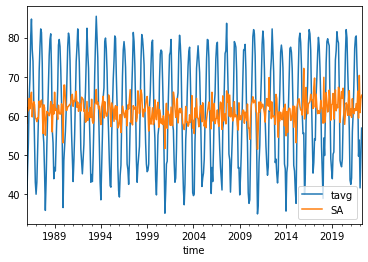

In [19]:
weather[['tavg', 'SA']].plot()
plt.rcParams['figure.figsize'] = [15,5]

This is a fantastic illustration of seasonal data. When correcting for the typical seasonal movements in temperature, we can see very little change is left over. This means that the majority of temperature fluctuation each month can be explained as standard seasonal effects. 

### Stock Market

In the stock market, seasonal effects have also been observed, leading to the expression "Sell in May and go away." Let's test if this is born out by the data.

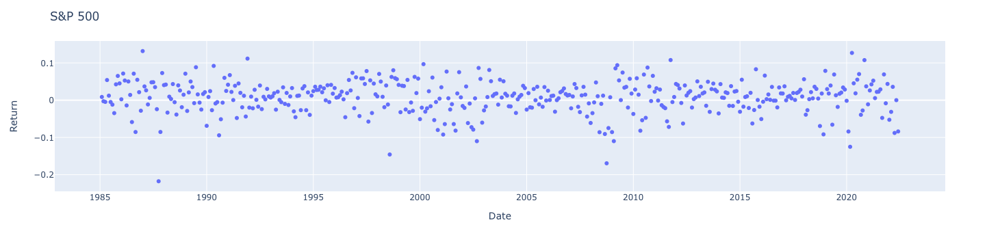

In [20]:
# SP500 monthly

fig = px.scatter(sp500, x=sp500.index, y='Return', log_y=False)
fig.update_layout(title="S&P 500")

In [21]:
sp500 = seasonally_adjust(sp500, 'Return', 12)

Mean: 0.007779642687809351

Seasonal offsets
Month 1: -0.004034
Month 2: 0.003002
Month 3: 0.008087
Month 4: 0.004046
Month 5: -0.007544
Month 6: 0.004072
Month 7: -0.010116
Month 8: -0.015427
Month 9: 0.001306
Month 10: 0.007893
Month 11: 0.008761
Month 12: -0.000144


In nearly 40 years of market history, we see an average monthly return of just under 1%. 

Unfortunately, the conventional wisdom that US stocks generally fall between May - October and rise from November - April did not hold up over this time period. Perhaps this principle was truer prior to the 1980s. But since then, it has not been. The modern investor should take it with a grain of salt.

# 2. Forecasting <a class="anchor" id="topic3"></a>

## Naive forecasting

[*********************100%***********************]  1 of 1 completed


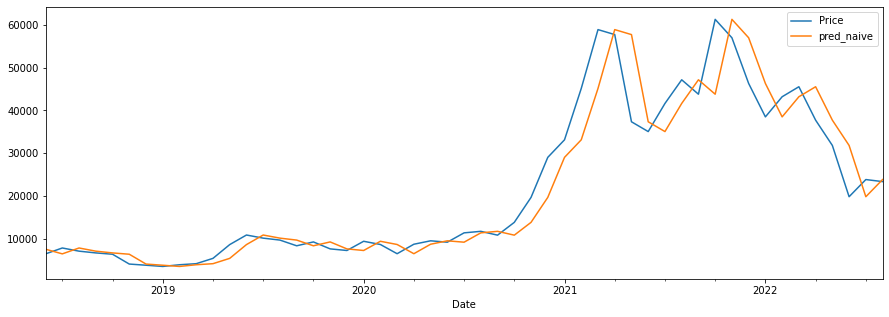

In [22]:
# Bitcoin price forecasting - let's become millionaires!

def pred_naive(df, col, dropna=False):
    df['pred_naive'] = df[col].shift()
    if dropna:
        df = df.dropna()
    return df

btc = yf.download('BTC-USD', interval='1mo')
btc = btc.rename(columns={'Adj Close': 'Price'})
btc.name = 'btc'

btc = pred_naive(btc, 'Price', dropna=True)

# Plot June data
btc[['Price', 'pred_naive']]['2018-06-01':].plot();
plt.rcParams['figure.figsize'] = [15,5]

As expected, this displays a mirror image of the actual price, but shifted one month into the future. 

## Seasonal naive forecasting

Let's revisit the Charlotte temperature data.

In [23]:
def pred_seasonal_naive(df, col, lag, dropna=False):
    df['pred_seasonal_naive'] = df[col].shift(lag)
    if dropna:
        df = df.dropna()
    return df

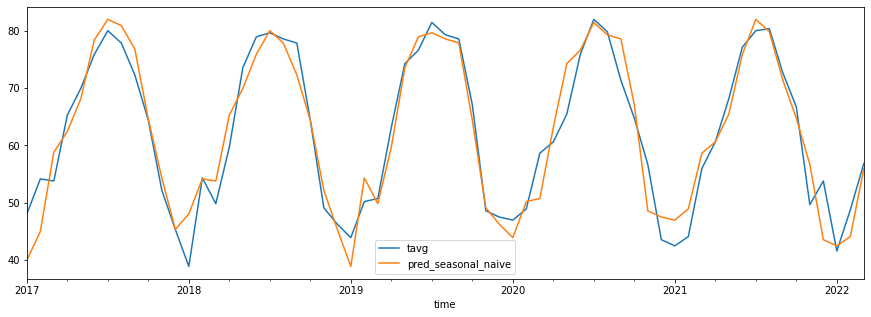

In [24]:
weather = pred_seasonal_naive(weather, 'tavg', 12, dropna=True)

weather[['tavg', 'pred_seasonal_naive']]['2017-01-01':].plot();
plt.rcParams['figure.figsize'] = [15,5]

Predicted temperatures based on a seasonal naive forecast are fairly accurate. The primary errors can be seen in the low temperatures from year to year in winter. 

### Average Forecasting

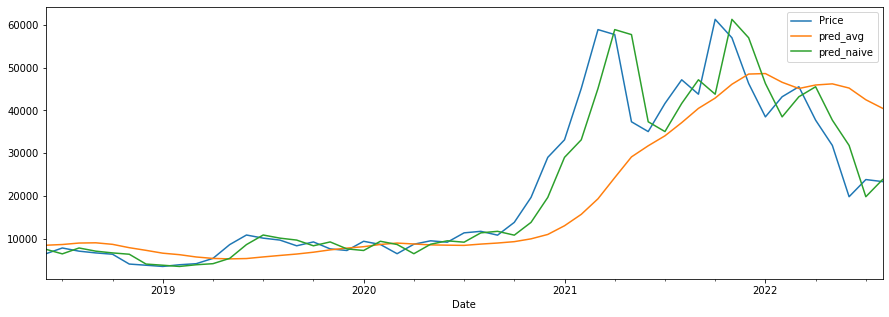

In [25]:
def pred_average(df, col, lookback, dropna=False): 
    df['pred_avg'] = (df[col].cumsum().shift(1) - df[col].cumsum().shift(lookback+1)) / lookback
    if dropna:
        df = df.dropna()
    return df

btc = pred_average(btc, 'Price', 10)
btc[['Price', 'pred_avg', 'pred_naive']]['2018-06-01':].plot();
plt.rcParams['figure.figsize'] = [15,5]

The above average-based forecast takes the average of the prior 10 months of price data. This smooths the true graph, identical to moving averages which are quite familiar in the world of stock trading, except that here it is used for the purpose of forecasting future data rather than providing a perspective on prior data.

The average is, naturally, very sensitive to the number of periods it incorporates. When taking only the last 2 months in our average, the prediction comes much closer to the actual price. The echoes the fact that the best prediction is often simply the prior day's value!

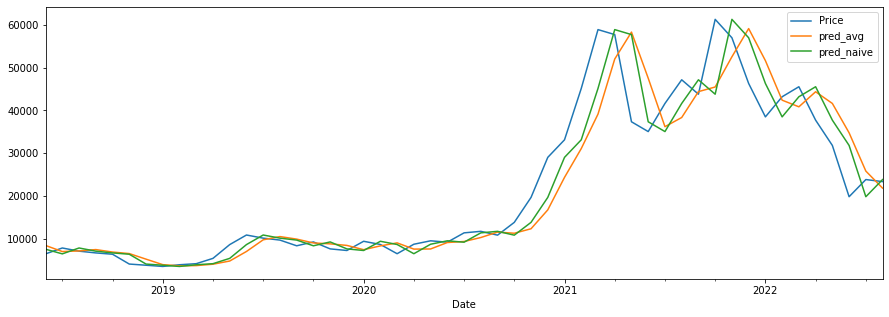

In [26]:
btc = pred_average(btc, 'Price', 2, dropna=True)
btc[['Price', 'pred_avg', 'pred_naive']]['2018-06-01':].plot();
plt.rcParams['figure.figsize'] = [15,5]

### Difference Average Forecasting

Difference-based averages are useful when data is trending. For this we'll return to cumulative CPI, which followed a fairly consistent upward trend. To make the data visible, we'll zoom in on the past 2 years.

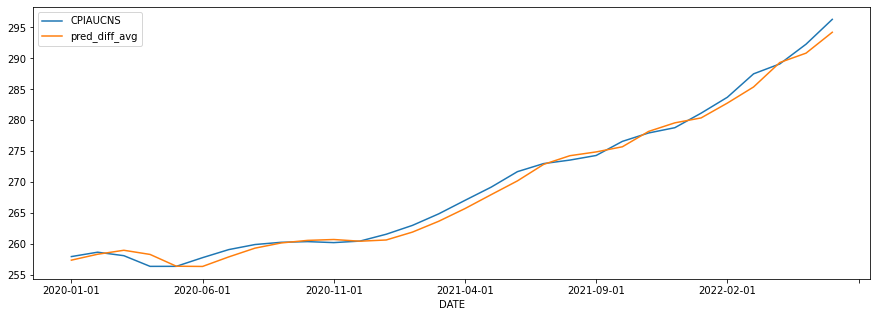

In [27]:
def pred_diff_average(df, col, lookback, dropna=False): 
    df['diff'] = df[col] - df[col].shift()
       
    df['pred_diff_avg'] = (df['diff'].cumsum().shift() - df['diff'].cumsum().shift(lookback+1)) / lookback
    df['pred_diff_avg'] = df['pred_diff_avg'] + df[col].shift()
    
    if dropna:
        df = df.dropna()
    
    return df
    
cpi = pred_diff_average(cpi, 'CPIAUCNS', 10, dropna=True)

cpi[['CPIAUCNS', 'pred_diff_avg']]['2020-01-01':].plot();
plt.rcParams['figure.figsize'] = [15,5]

Difference average forecasting shows a great ability to follow trending data, as we would expect. A good tool for the toolkit.

## Evaluation of Forecasting Techniques

We will finish running each forecasting type for each dataset then see if any were able to beat a naive baseline (which asumes the next value in a series is the same as the last). If we can't beat the naive baseline, then our forecast should not be used.

However, before doing this, we'll introduce a couple more datasets.

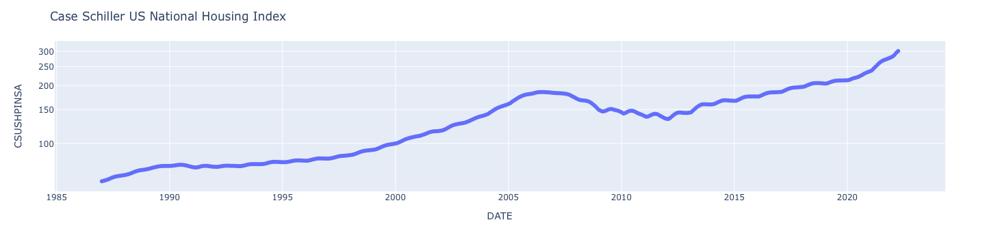

In [28]:
# US Housing index
# Data obtained from https://fred.stlouisfed.org/series/CSUSHPINSA

data = 'CSUSHPINSA.csv'
housing = pd.read_csv(data)
housing.index = housing['DATE']
housing = housing.drop(columns=['DATE'])

fig = px.scatter(housing, x=housing.index, y='CSUSHPINSA', log_y=True)
fig.update_layout(title="Case Schiller US National Housing Index")

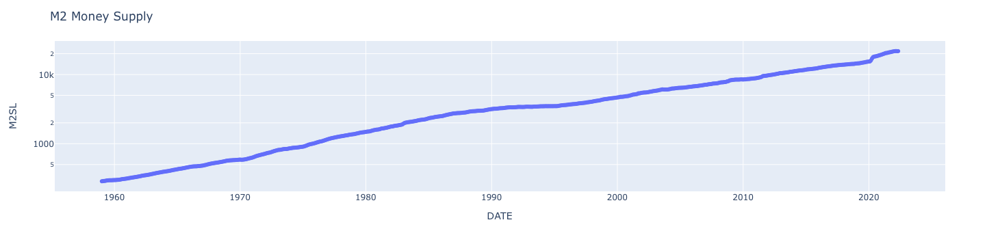

In [29]:
# M2 money supply
# Data obtained from https://fred.stlouisfed.org/series/M2SL

data = 'M2SL.csv'
m2 = pd.read_csv(data)
m2.index = m2['DATE']
m2 = m2.drop(columns=['DATE'])

fig = px.scatter(m2, x=m2.index, y='M2SL', log_y=True)
fig.update_layout(title="M2 Money Supply")

In [30]:
def rmse_eval(df, obs_col, pred_col): 
    total_error_sqr, total_pred = 0, 0
    values = df[obs_col]
    preds = df[pred_col] 
    for val, pred in zip(values, preds): 
        if pred is not None:
            if pred > 0:
                total_error_sqr += (pred-val)**2 
                total_pred += 1
    return np.sqrt(total_error_sqr / total_pred)

In [31]:
def pred_all(df, obs_col, seasonal_lookback, avg_period):

    df = pred_naive(df, obs_col, dropna=True)
    df = pred_seasonal_naive(df, obs_col, seasonal_lookback, dropna=True)
    df = pred_average(df, obs_col, avg_period, dropna=True)
    df = pred_diff_average(df, obs_col, avg_period, dropna=True)

    errors = []
    for col in df.columns:
        if col.startswith('pred'):
            errors.append(rmse_eval(df, obs_col, col))
        
    return errors

### Raw datasets

In [32]:
weather_errors = pred_all(weather, 'tavg', 12, 5)
cpi_errors = pred_all(cpi, 'CPIAUCNS', 12, 5)
sp500_errors = pred_all(sp500, 'Adj Close', 12, 5)
btc_errors = pred_all(btc, 'Price', 12, 5)
housing_errors = pred_all(housing, 'CSUSHPINSA', 12, 5)
m2_errors = pred_all(m2, 'M2SL', 12, 5)

dfs = ['weather', 'cpi', 'sp500', 'btc', 'housing', 'm2']
forecasts = ['pred_naive', 'pred_seasonal_naive', 'pred_average', 'pred_diff_average']
rmse_table = pd.DataFrame(index=dfs, columns=forecasts)

rmse_table.loc['weather'] = weather_errors
rmse_table.loc['cpi'] = cpi_errors
rmse_table.loc['sp500'] = sp500_errors
rmse_table.loc['btc'] = btc_errors
rmse_table.loc['housing'] = housing_errors
rmse_table.loc['m2'] = m2_errors
rmse_table

,pred_naive,pred_seasonal_naive,pred_average,pred_diff_average
weather,4.039475,7.874659,16.766565,9.591262
cpi,0.728386,0.829263,5.705696,1.917254
sp500,74.707185,280.166728,108.176922,78.423174
btc,5414.461585,8380.288403,17205.36883,6033.068905
housing,1.395923,12.491876,3.775471,0.9342
m2,70.360404,652.957376,184.240451,52.638454


So far, the forecasts don't look great. The starting point is to see if they can outperform a naive baseline - where we forecast the next value to be the same as the last one. This is the naive prediction in the first column above. Here, only the M2 data and housing data, predicting using diff averages, outperform the naive prediction.

### Seasonally adjusted datasets

In [33]:
cpi = seasonally_adjust(cpi, 'CPIAUCNS', 12)
btc = seasonally_adjust(btc, 'Price', 12)
housing = seasonally_adjust(housing, 'CSUSHPINSA', 12)
m2 = seasonally_adjust(m2, 'M2SL', 12)

Mean: 181.38524845995894

Seasonal offsets
Month 1: -2.117200
Month 2: -1.415687
Month 3: -0.696078
Month 4: 0.164727
Month 5: 0.794800
Month 6: 1.375020
Month 7: 1.971313
Month 8: -0.606598
Month 9: -0.270873
Month 10: 0.195677
Month 11: 0.383552
Month 12: 0.219427
Mean: 13326.20475601364

Seasonal offsets
Month 1: 805.686300
Month 2: 2137.273927
Month 3: 1767.199478
Month 4: -1113.344458
Month 5: -2750.959757
Month 6: -1025.575518
Month 7: -282.637598
Month 8: -2657.730626
Month 9: 688.178793
Month 10: 898.762638
Month 11: 1215.963235
Month 12: 383.234675
Mean: 135.47408254716981

Seasonal offsets
Month 1: -1.292416
Month 2: -0.956916
Month 3: 0.116279
Month 4: 1.479834
Month 5: -1.939540
Month 6: -0.782911
Month 7: 0.039546
Month 8: 0.527146
Month 9: 0.692117
Month 10: 0.730346
Month 11: 0.720060
Month 12: 0.685117
Mean: 4790.0089356110375

Seasonal offsets
Month 1: -5.947998
Month 2: 20.080127
Month 3: 50.806689
Month 4: 88.348877
Month 5: 125.225439
Month 6: -117.861317
Month 7: -

In [35]:
weather_sa_errors = pred_all(weather, 'SA', 12, 5)
cpi_sa_errors = pred_all(cpi, 'SA', 12, 5)
sp500_sa_errors = pred_all(sp500, 'SA', 12, 5)
btc_sa_errors = pred_all(btc, 'SA', 12, 5)
housing_sa_errors = pred_all(housing, 'SA', 12, 5)
m2_sa_errors = pred_all(m2, 'SA', 12, 5)

dfs = ['weather_sa', 'cpi_sa', 'sp500_sa', 'btc_sa', 'housing_sa', 'm2_sa']
forecasts = ['pred_naive', 'pred_seasonal_naive', 'pred_average', 'pred_diff_average']

rmse_table.loc['weather_sa'] = weather_sa_errors
rmse_table.loc['cpi_sa'] = cpi_sa_errors
rmse_table.loc['sp500_sa'] = sp500_sa_errors
rmse_table.loc['btc_sa'] = btc_sa_errors
rmse_table.loc['housing_sa'] = housing_sa_errors
rmse_table.loc['m2_sa'] = m2_sa_errors
rmse_table

,pred_naive,pred_seasonal_naive,pred_average,pred_diff_average
weather,4.039475,7.874659,16.766565,9.591262
cpi,0.728386,0.829263,5.705696,1.917254
sp500,74.707185,280.166728,108.176922,78.423174
btc,5414.461585,8380.288403,17205.36883,6033.068905
housing,1.395923,12.491876,3.775471,0.9342
m2,70.360404,652.957376,184.240451,52.638454
weather_sa,4.039475,3.781317,3.017572,4.208143
cpi_sa,1.192361,1.19214,5.705696,1.980834
sp500_sa,0.048303,0.057108,0.039888,0.053502
btc_sa,5040.898385,8101.983697,17738.661222,5620.628886


The weather forecasts improved used naive seasonal forecasting as well as the average prediction.

S&P500 improved using average prediction.

## Log difference datasets

In [36]:
# Take the log differences

weather['log diff'] = np.log(weather['tavg']) - np.log(weather['tavg'].shift())
cpi['log diff'] = np.log(cpi['CPIAUCNS']) - np.log(cpi['CPIAUCNS'].shift())
sp500['log diff'] = np.log(sp500['Adj Close']) - np.log(sp500['Adj Close'].shift())
btc['log diff'] = np.log(btc['Price']) - np.log(btc['Price'].shift())
housing['log diff'] = np.log(housing['CSUSHPINSA']) - np.log(housing['CSUSHPINSA'].shift())
m2['log diff'] = np.log(m2['M2SL']) - np.log(m2['M2SL'].shift())

In [37]:
weather_ld_errors = pred_all(weather, 'log diff', 12, 5)
cpi_ld_errors = pred_all(cpi, 'log diff', 12, 5)
sp500_ld_errors = pred_all(sp500, 'log diff', 12, 5)
btc_ld_errors = pred_all(btc, 'log diff', 12, 5)
housing_ld_errors = pred_all(housing, 'log diff', 12, 5)
m2_ld_errors = pred_all(m2, 'log diff', 12, 5)

dfs = ['weather_ld', 'cpi_ld', 'sp500_ld', 'btc_ld', 'housing_ld', 'm2_ld']
forecasts = ['pred_naive', 'pred_seasonal_naive', 'pred_average', 'pred_diff_average']

rmse_table.loc['weather_ld'] = weather_ld_errors
rmse_table.loc['cpi_ld'] = cpi_ld_errors
rmse_table.loc['sp500_ld'] = sp500_ld_errors
rmse_table.loc['btc_ld'] = btc_ld_errors
rmse_table.loc['housing_ld'] = housing_ld_errors
rmse_table.loc['m2_ld'] = m2_ld_errors
rmse_table

,pred_naive,pred_seasonal_naive,pred_average,pred_diff_average
weather,4.039475,7.874659,16.766565,9.591262
cpi,0.728386,0.829263,5.705696,1.917254
sp500,74.707185,280.166728,108.176922,78.423174
btc,5414.461585,8380.288403,17205.36883,6033.068905
housing,1.395923,12.491876,3.775471,0.9342
m2,70.360404,652.957376,184.240451,52.638454
weather_sa,4.039475,3.781317,3.017572,4.208143
cpi_sa,1.192361,1.19214,5.705696,1.980834
sp500_sa,0.048303,0.057108,0.039888,0.053502
btc_sa,5040.898385,8101.983697,17738.661222,5620.628886


Again we see see some improvements over the naive baseline, albeit using different forecasts than before. 

The takeaways? 

1. This is why perform decomposition, to improve forecasting accuracy. 

2. Datasets vary. Therefore, methods must be tested and tailored. This is similar to grid search in machine learning, where we test different hyperparameters to find the ones that produce that best results.

3. If a dataset trends to the point where it occupies different orders of magnitude over time, absolute errors will not be meaningful. We must rely on log differences or a similar measure that corrects for the effect.

# 3. Regression and Simulated Trading <a class="anchor" id="topic4"></a>

## Regression

Regression is a fundamental concept in time series modelling and forecasting. We will demonstrate it here using what is undoubtedly the coolest dataset in this paper. 

Economist Edward McQuarrie constructed an index of US stock prices going back all the way to the time of George Washington. To accomplish this feat, he leveraged digitized newspaper archives to find daily stock prices and reconstruct annual returns all the way back to 1793.

Read more about his work here: [Stocks for the Long Run? Sometimes Yes. Sometimes No.](http://www.edwardfmcquarrie.com/?p=579)

The below shows a theoretical 1 dollar (at today's value) becoming about 1,000,000 dollars by 2022. 

In [43]:
# Annual real stock returns history
# Data obtained from http://www.edwardfmcquarrie.com/?p=579
# Code adapted from my CW2 submission in DSM020 Programming in Python

data = 'Real-returns-on-stocks-and-bonds-1793-to-2019-version-2-0.xlsx'
stocks = pd.read_excel(data, sheet_name='real returns 1793-2019')
stocks = stocks.rename(columns={'To January of:': 'Year'})
stocks.index = stocks['Year']
stocks = stocks['Real stock return'].to_frame()
stocks = stocks.dropna()

In [133]:
# Add data for 2020-2022, using SP500 returns as a proxy for the overall market
stocks_update = yf.download('^GSPC', start='2019-01-01', end='2022-01-01', interval='1mo')
stocks_update = stocks_update['Adj Close'].to_frame()

# Convert to gain/loss and add to stocks dataframe
stocks.loc[2020] = (stocks_update.loc['2020-01-01'] / stocks_update.loc['2019-01-01'] - 1)[0]
stocks.loc[2021] = (stocks_update.loc['2021-01-01'] / stocks_update.loc['2020-01-01'] - 1)[0] 
stocks.loc[2022] = (stocks_update.loc['2022-01-01'] / stocks_update.loc['2021-01-01'] - 1)[0]

# Adjust new values for inflation. CPI figures taken from the Bureau of Labor Statistics
stocks.loc[2020] = stocks.loc[2020] * (1 - .023)
stocks.loc[2021] = stocks.loc[2021] * (1 - .014)
stocks.loc[2022] = stocks.loc[2022] * (1 - .075)

stocks.index = pd.to_datetime(stocks.index, format='%Y')

stocks

[*********************100%***********************]  1 of 1 completed


,Real stock return
Year,
1794-01-01,-0.138960
1795-01-01,0.062568
1796-01-01,0.003523
1797-01-01,-0.041162
1798-01-01,0.174941
...,...
2018-01-01,0.215006
2019-01-01,-0.044072
2020-01-01,0.188391


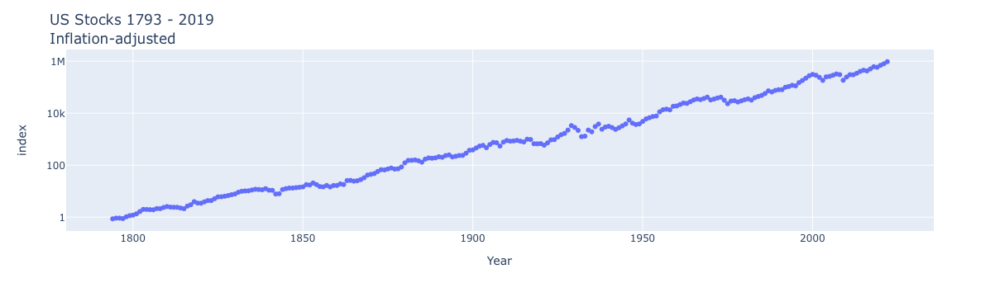

In [134]:
# Calculate index price based on cumulative returns
stocks['index'] = (stocks['Real stock return'] + 1).cumprod()

fig = px.scatter(stocks, x=stocks.index, y='index', log_y=True)
fig.update_layout(title="US Stocks 1793 - 2019<br>Inflation-adjusted")

One of the striking things about this plot is that, on a log-transformed y-axis, the trend looks quite linear. 

Remember, the above shows 'real' values, not nominal ones. The starting value of $1 in 1793 is based on a 2019 dollar. Thus, the effects of inflation have been corrected for.

Wouldn't it be amazing if US stocks could be modelled by linear regression? One of Plotly's features is built-in regression support. We'll attempt a trendline based on a regression optimizing for ordinary least squares.

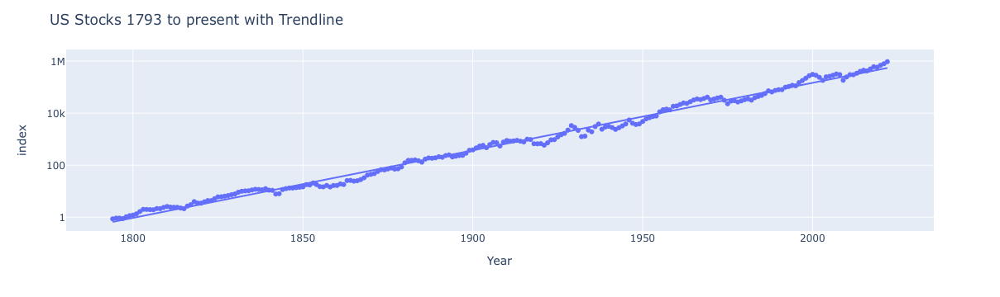

In [135]:
fig = px.scatter(stocks, x=stocks.index, y='index', log_y=True, trendline="ols", trendline_options=dict(log_y=True))
fig.update_layout(title="US Stocks 1793 to present with Trendline")

Before getting ahead of ourselves, lets take a look just at data through 1930 and see how the line looked then. You can see below that to the naked eye it seems identical. However, the shortened index's trendline ended 1930 at a value of 1733 dollars, whereas the full index's trendline was at a value of 2235 dollars in 1930. This is a difference of almost 30%.

What this means is that any predictions from 1930 on would have been lower than how the market ended up performing. Not such a bad thing. The more data we fit on, the more accurate you could say the model becomes. 

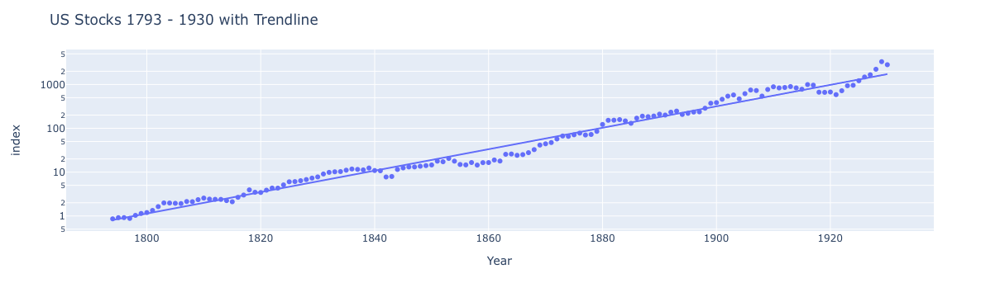

In [136]:
stocks_half = stocks.loc[:'1930-01-01']
fig = px.scatter(stocks_half, x=stocks_half.index, y='index', log_y=True, trendline="ols", trendline_options=dict(log_y=True))
fig.update_layout(title="US Stocks 1793 - 1930 with Trendline")

Stocks are notoriously difficult to forecast. However, forecasters may simply need to zoom out. Over sufficiently long periods, the US market can be modelled fairly well. 

This may not be useful to the average quantitative analyst, who tend to be concerned about much shorter timeframes than decades. For example, the index can be seen to be above the trendline for 2022. While this might suggest a downward correction back to the trendline, past trends suggest it could be years before this happens. 

Nonetheless, for the long-term investor, this data is quite reassuring. Over long periods, the markets indeed follow a predictable trend.

In [137]:
stocks_ld_errors = pred_all(stocks, 'Real stock return', 1, 5)

rmse_table.loc['stocks_ld'] = stocks_ld_errors
rmse_table

,pred_naive,pred_seasonal_naive,pred_average,pred_diff_average
weather,4.039475,7.874659,16.766565,9.591262
cpi,0.728386,0.829263,5.705696,1.917254
sp500,74.707185,280.166728,108.176922,78.423174
btc,5415.059705,8385.426295,17212.382431,6030.373596
housing,1.395923,12.491876,3.775471,0.9342
m2,70.360404,652.957376,184.240451,52.638454
weather_sa,4.039475,3.781317,3.017572,4.208143
cpi_sa,1.192361,1.19214,5.705696,1.980834
sp500_sa,0.048303,0.057108,0.039888,0.053502
btc_sa,5041.810878,8106.659777,17746.030834,5618.867014


## Partial Autocorrelation
We know diffed datasets have shown a high degree of stationary, so we'll use this from CPI.

In [138]:
cpi.dropna(inplace=True)
adf_test(cpi, 'diff2')

ADF Statistic: -13.704615
p-value: 0.000000


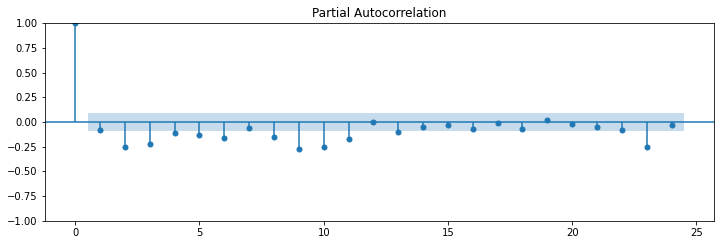

In [139]:
cpi_training = cpi['diff2'].loc[:'2019-12-31']

fig = plt.figure(figsize=(12,8))
ax2 = fig.add_subplot(212)
fig = sm.graphics.tsa.plot_pacf(cpi_training, lags=24, ax=ax2, method='ywm')

It's interesting that a lag of 1 did not show a signficant correlation. Nonetheless, many other periods did.

The largest correlations were negative. We are interested in negative as well as positive autocorrelation values. The main point is finding values outside the blue bands. Anything within the bands represent autocorrelations that are not statistically significant. 

In [140]:
results = sm.tsa.AutoReg(cpi_training, [2, 3, 5, 6, 8, 9, 10, 11, 23]).fit()
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            AutoReg Model Results                             
==============================================================================
Dep. Variable:                  diff2   No. Observations:                  455
Model:             Restr. AutoReg(23)   Log Likelihood                -370.391
Method:               Conditional MLE   S.D. of innovations              0.570
Date:                Mon, 01 Aug 2022   AIC                            762.782
Time:                        18:28:08   BIC                            807.534
Sample:                    01-01-1984   HQIC                           780.450
                         - 12-01-2019                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.0005      0.027      0.019      0.985      -0.053       0.054
diff2.L2      -0.2989      0.046     -6.454      0.000      -0.390      -0.208
diff2.L3      -0.2739      0.048     -5.755      0.000      -0.367      -0.181
diff2.L5      -0.1570      0.049     -3.216      0.001      -0.253      -0.061
diff2.L6      -0.1746      0.049     -3.586      0.000      -0.270      -0.079
diff2.L8      -0.1662      0.051     -3.239      0.001      -0.267      -0.066
diff2.L9      -0.1960      0.048     -4.089      0.000      -0.290      -0.102
diff2.L10     -0.0901      0.047     -1.931      0.054      -0.182       0.001
diff2.L11      0.0208      0.050      0.420      0.675      -0.076       0.118
diff2.L23     -0.1173      0.046     -2.567      0.010      -0.207      -0.028
                                    Roots                                     
==============================================================================
                   Real          Imaginary           Modulus         Frequency
------------------------------------------------------------------------------
AR.1            -1.1086           -0.0000j            1.1086           -0.5000
AR.2            -1.0501           -0.2982j            1.0916           -0.4560
AR.3            -1.0501           +0.2982j            1.0916            0.4560
AR.4            -0.9487           -0.5638j            1.1036           -0.4147
AR.5            -0.9487           +0.5638j            1.1036            0.4147
AR.6            -0.7635           -0.8148j            1.1166           -0.3698
AR.7            -0.7635           +0.8148j            1.1166            0.3698
AR.8            -0.4924           -1.0104j            1.1240           -0.3222
AR.9            -0.4924           +1.0104j            1.1240            0.3222
AR.10           -0.1738           -1.0441j            1.0585           -0.2763
AR.11           -0.1738           +1.0441j            1.0585            0.2763
AR.12            0.0495           -1.0852j            1.0864           -0.2427
AR.13            0.0495           +1.0852j            1.0864            0.2427
AR.14            0.3844           -1.0093j            1.0800           -0.1921
AR.15            0.3844           +1.0093j            1.0800            0.1921
AR.16            0.5804           -0.8997j            1.0707           -0.1588
AR.17            0.5804           +0.8997j            1.0707            0.1588
AR.18            0.8637           -0.7061j            1.1156           -0.1091
AR.19            0.8637           +0.7061j            1.1156            0.1091
AR.20            0.9651           -0.4586j            1.0685           -0.0706
AR.21            0.9651           +0.4586j            1.0685            0.0706
AR.22            1.1397           -0.1991j            1.1570           -0.0275
AR.23            1.1397           +0.1991j            1.1570            0.0275
------------------------------------------------------------------------------
""

The below plot visualizes how the prediction compares to the test data from 2020 to 2022. The prediction performs very badly. It appears to start subtly decaying over time, which is a sign this can be modelled with PACF. If the predicted values suddenly dropped in accuracy, that would indicate a moving average would be a better fit.

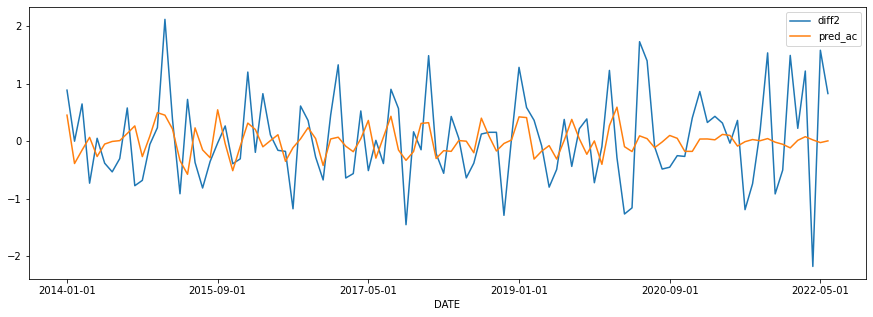

In [141]:
cpi['pred_ac'] = results.predict(end='2022-07-01')
cpi[['diff2', 'pred_ac']]['2014-01-01':].plot();

In [142]:
cpi['pred_naive_diff2'] = cpi['diff2'].shift()
cpi.dropna(inplace=True)

print('Autocorrelation RMSE:', rmse_eval(cpi, 'diff2', 'pred_ac'))
print('Naive RMSE:', rmse_eval(cpi, 'diff2', 'pred_naive_diff2'))

Autocorrelation RMSE: 0.6228774569739504
Naive RMSE: 1.0128921168451146


The predictions here perform well, improving on the naive baseline.

## Autoregression

Of the 2 datasets above, Charlotte temperatures gave the highest correlation value. -0.75 at lag 2, while being negative, was the furthest value from 0, which is what we're seeking.

In [143]:
def train_ar(values, order):
    target_vector = np.array(values[order:]) 
    lagged_values = []
    for i in range(len(values) - order):
        lagged_values.append(values[i:i+order])
    design_matrix = np.array(lagged_values)
    return np.linalg.inv(design_matrix.transpose() @ design_matrix) @ design_matrix.transpose() @ target_vector

def predict(coeffs, data):
    predicted_values = [math.nan] * len(coeffs) 
    for i in range(len(coeffs), len(data)):
        predicted_values.append(np.dot(coeffs, data[i-len(coeffs):i])[0]) 
    return predicted_values

weather_training = weather['tavg'][:'2014-12-01']
model_coeffs = train_ar(weather_training, 2)
model_coeffs

array([-0.59390363,  1.58137826])

In [144]:
weather_test = weather['tavg']['2014-12-01':].to_frame()
weather_test['pred_ar'] = predict(model_coeffs, weather_test)

rmse_eval(weather_test, 'tavg', 'pred_ar')

7.449878839932081

Comparing this error to the other methods we've tried, it beats all the non-seasonally adjusted methods, though fails to beat the naive baseline. 

In [145]:
rmse_table

,pred_naive,pred_seasonal_naive,pred_average,pred_diff_average
weather,4.039475,7.874659,16.766565,9.591262
cpi,0.728386,0.829263,5.705696,1.917254
sp500,74.707185,280.166728,108.176922,78.423174
btc,5415.059705,8385.426295,17212.382431,6030.373596
housing,1.395923,12.491876,3.775471,0.9342
m2,70.360404,652.957376,184.240451,52.638454
weather_sa,4.039475,3.781317,3.017572,4.208143
cpi_sa,1.192361,1.19214,5.705696,1.980834
sp500_sa,0.048303,0.057108,0.039888,0.053502
btc_sa,5041.810878,8106.659777,17746.030834,5618.867014


The natural next step is to perform autoregression on seasonally adjusted data to see if that might help. 

As you can see below, it drastically improves the results. However, its performance is middle-of-the-road compared to other prediction methods. Therefore, AutoRegression would not be the final choice for this dataset.

In [146]:
weather_training_sa = weather['SA'][:'2014-12-01']

model_coeffs = train_ar(weather_training_sa, 2)
model_coeffs

weather_test = weather['SA']['2014-12-01':].to_frame()
weather_test['pred_ar'] = predict(model_coeffs, weather_test)

rmse_eval(weather_test, 'SA', 'pred_ar')

3.9863214144236916

In [147]:
rmse_table['pred_ar'] = np.nan
rmse_table['pred_ar'].loc['weather_sa'] = rmse_eval(weather_test, 'SA', 'pred_ar')

rmse_table

,pred_naive,pred_seasonal_naive,pred_average,pred_diff_average,pred_ar
weather,4.039475,7.874659,16.766565,9.591262,NaN
cpi,0.728386,0.829263,5.705696,1.917254,NaN
sp500,74.707185,280.166728,108.176922,78.423174,NaN
btc,5415.059705,8385.426295,17212.382431,6030.373596,NaN
housing,1.395923,12.491876,3.775471,0.9342,NaN
m2,70.360404,652.957376,184.240451,52.638454,NaN
weather_sa,4.039475,3.781317,3.017572,4.208143,3.986321
cpi_sa,1.192361,1.19214,5.705696,1.980834,NaN
sp500_sa,0.048303,0.057108,0.039888,0.053502,NaN
btc_sa,5041.810878,8106.659777,17746.030834,5618.867014,NaN


## Simulated Trading

We have several options in our dataset we could choose from. Price movements of the overall stock market are likely too complex for these purposes, so we will focus on a single item. Bitcoin price will do nicely.

So far we've used monthly price data from Yahoo Finance, which only goes back to 2014. Here we'll use daily data which goes back to the earliest days when Bitcoin had a US dollar value, thanks to the Quandl library.

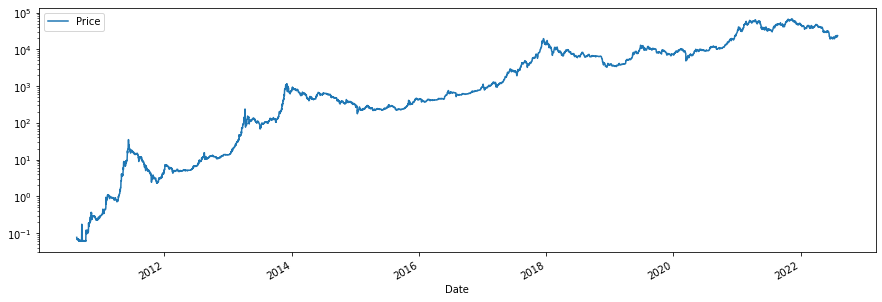

In [148]:
btc_daily = qd.get('BCHAIN/MKPRU')
btc_daily = btc_daily.loc[(btc_daily !=0).any(1)]
btc_daily = btc_daily.rename(columns={'Value': 'Price'})

btc_daily.plot(logy=True);

In [149]:
btc_training = btc_daily['Price'][:'2020-08-31']
model_coeffs = train_ar(btc_training, 3)

btc_test = btc_daily['Price']['2020-09-01':].to_frame()
log_pred = predict(model_coeffs, np.log(btc_test))

btc_test['pred_ar'] = np.exp(log_pred)
btc_test = btc_test.dropna()

In [150]:
btc_test['holding'] = btc_test['pred_ar'] > btc_test['pred_ar'].shift() * 1.004
btc_test

,Price,pred_ar,holding
Date,,,
2020-09-04,10187.51,11373.007525,False
2020-09-05,10467.89,10141.480693,False
2020-09-06,10159.62,10404.223816,True
2020-09-07,10254.93,10140.342217,False
2020-09-08,10367.74,10218.555397,True
...,...,...,...
2022-07-28,22950.29,21167.346697,False
2022-07-29,23856.25,22890.397393,True
2022-07-30,23792.00,23848.883686,True


In [151]:
last_price = None
portfolio_value = 10_000
values = []
for ts, (close, _, holding) in btc_test.iterrows():
    if holding:
        portfolio_value *= close / last_price
    last_price = close
    values.append(portfolio_value)
    
btc_test['portfolio'] = values  

btc_test

,Price,pred_ar,holding,portfolio
Date,,,,
2020-09-04,10187.51,11373.007525,False,10000.000000
2020-09-05,10467.89,10141.480693,False,10000.000000
2020-09-06,10159.62,10404.223816,True,9705.508942
2020-09-07,10254.93,10140.342217,False,9705.508942
2020-09-08,10367.74,10218.555397,True,9812.275001
...,...,...,...,...
2022-07-28,22950.29,21167.346697,False,11484.070366
2022-07-29,23856.25,22890.397393,True,11937.402694
2022-07-30,23792.00,23848.883686,True,11905.252707


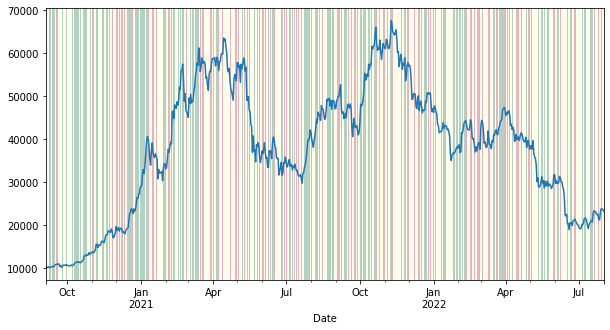

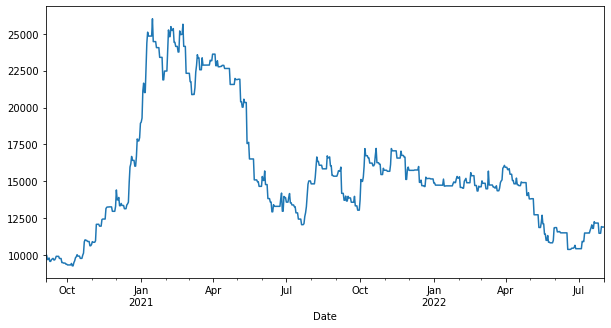

In [152]:
offsets = (btc_test['holding'] * (btc_test['Price'].shift(-1) - btc_test['Price']))
has_increased = ((btc_test['Price'].shift(-1) > btc_test['Price']) & btc_test['holding']).astype(int)
has_decreased = ((btc_test['Price'].shift(-1) < btc_test['Price']) & btc_test['holding']).astype(int)
plt.rcParams['figure.figsize'] = [10, 5]
ax = btc_test['Price'].plot()
offset_start = has_increased.index[0].timestamp() / 24 / 60 / 60
offset_end = has_increased.index[-1].timestamp() / 24 / 60 / 60
ax.pcolorfast((offset_start, offset_end), ax.get_ylim(), (has_increased - has_decreased).values[np.newaxis], cmap='RdYlGn', alpha = 0.3)
plt.figure()
btc_test['portfolio'].plot();

These results are pretty funny. Within several months of the test data starting, the Bitcoin price was up about 600%. By the end of the test data, price had settled in about 100% up from where it started. Meanwhile, the portfolio ended this period right where it had started.

Perhaps some grid search can improve the ending value of our portfolio.

In [153]:
btc_training = btc_daily['Price'][:'2020-08-31']
model_coeffs = train_ar(btc_training, 3)

btc_test = btc_daily['Price']['2020-09-01':].to_frame()
log_pred = predict(model_coeffs, np.log(btc_test))

btc_test['pred_ar'] = np.exp(log_pred)
btc_test = btc_test.dropna()

# Try all daily increase increase values between .001 and .5
results = []
for increase in range(1, 500):
    btc_test['holding'] = btc_test['pred_ar'] > btc_test['pred_ar'].shift() * (1 + increase/1000)
    
    last_price = None
    portfolio_value = 10_000
    values = []
    for ts, (close, _, holding) in btc_test.iterrows():
        if holding:
            portfolio_value *= close / last_price
        last_price = close
        values.append(portfolio_value)
    
    # Update results dict with increase and ending portfolio value
    results.append(values[-1])

In [154]:
print(results.index(np.max(results)), np.max(results))

41 14430.01154213514


The best performing parameter lead to a portfolio worth almost 50% more. Not a bad return in 2 years!

This came from trading based on a daily increase of 1.8%. Let's plot that result.

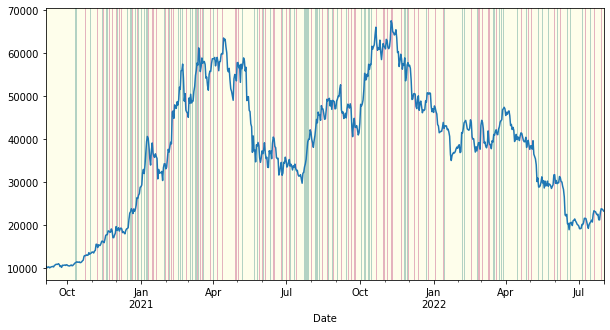

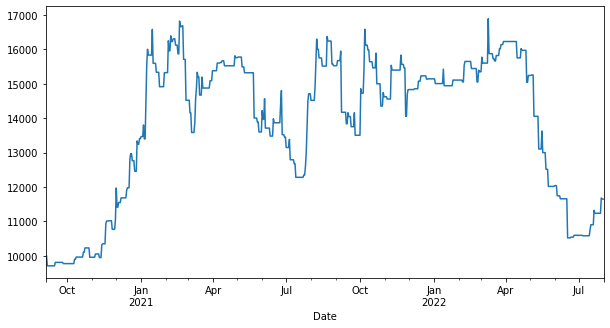

In [155]:
btc_test['holding'] = btc_test['pred_ar'] > btc_test['pred_ar'].shift() * 1.018

last_price = None
portfolio_value = 10_000
values = []
for ts, (close, _, holding) in btc_test.iterrows():
    if holding:
        portfolio_value *= close / last_price
    last_price = close
    values.append(portfolio_value)
    
btc_test['portfolio'] = values  

offsets = (btc_test['holding'] * (btc_test['Price'].shift(-1) - btc_test['Price']))
has_increased = ((btc_test['Price'].shift(-1) > btc_test['Price']) & btc_test['holding']).astype(int)
has_decreased = ((btc_test['Price'].shift(-1) < btc_test['Price']) & btc_test['holding']).astype(int)
plt.rcParams['figure.figsize'] = [10, 5]
ax = btc_test['Price'].plot()
offset_start = has_increased.index[0].timestamp() / 24 / 60 / 60
offset_end = has_increased.index[-1].timestamp() / 24 / 60 / 60
ax.pcolorfast((offset_start, offset_end), ax.get_ylim(), (has_increased - has_decreased).values[np.newaxis], cmap='RdYlGn', alpha = 0.3)
plt.figure()
btc_test['portfolio'].plot();

Before we consider this a generalizable result, more testing should be done to determine if trading based on a daily increase of 1.8% has held up over more than just the last 2 years of Bitcoin's history. We'll leave that determination for another time. 

# 4. Monte Carlo Simulations <a class="anchor" id="topic5"></a>

We'll continue using Bitcoin price data as we explore a new method of forecasting, Monte Carlo simulations. For this we will go back to monthly data.

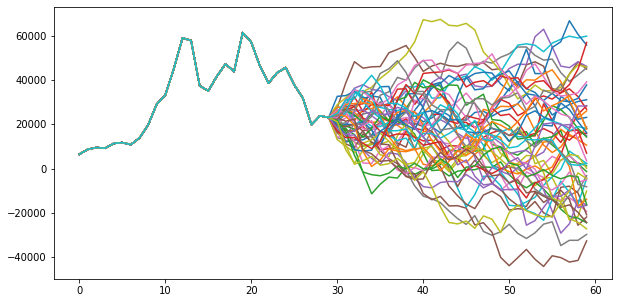

In [156]:
def rmse(predicted, actual):
    diffs = predicted - actual
    return math.sqrt(np.mean(diffs ** 2))

trajectory_length = 30
btc_series = btc['Price']
ar_deg = 4

model = sm.tsa.AutoReg(btc_series, ar_deg, trend='n').fit()

coeffs = np.array(list(reversed(model.params)))

num_coeffs = coeffs.shape[0]
num_samples = 50

initial_values = np.array(btc_series.iloc[-trajectory_length:].values).reshape(1,-1)

values = np.broadcast_to(initial_values, (num_samples, trajectory_length))

std_dev = rmse(model.predict(), btc_series)

for i in range(trajectory_length):
    next_prediction = values[:,-ar_deg:] @ coeffs
    next_column = next_prediction + std_dev * np.random.randn(num_samples) 
    values = np.append(values, next_column.reshape(num_samples, 1), axis=1)
    
    
plt.plot(values.transpose());

As interesting as this result looks, unfortunately there are a few issues with it. The paramater of the autoregression was chosen arbitrarily, without running the PACF. More importantly, the data  was not tested for stationarity. Since this is Bitcoin, we can be certain it is not stationary! 

In [157]:
# Confirm non-stationarity
btc.dropna(inplace=True)
adf_test(btc, 'Price')

ADF Statistic: -1.758367
p-value: 0.401318


Lets do the same again, using the log differences of daily prices. We'll run the PACF ahead of time to help choose the best AR parameter.

In [158]:
# Test for stationarity
adf_test(btc, 'log diff')

ADF Statistic: -7.948687
p-value: 0.000000


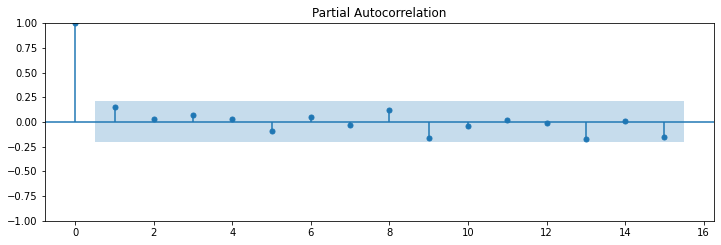

In [159]:
btc_series = btc['log diff']

fig = plt.figure(figsize=(12,8))
ax2 = fig.add_subplot(212)
fig = sm.graphics.tsa.plot_pacf(btc_series, lags=15, ax=ax2, method='ywm')

This is a problem. The above correlation numbers are very low, indicating this is not a good candidate for autoregression or Monte Carlo simulation. 

Let's try the Case-Schiller housing dataset. 

In [160]:
# Test for stationarity
housing.dropna(inplace=True)
adf_test(housing, 'log diff')

ADF Statistic: -3.172871
p-value: 0.021610


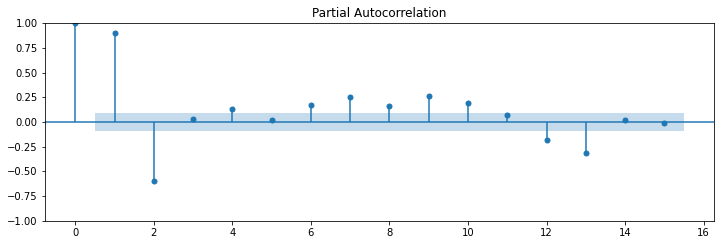

In [161]:
housing_series = housing['log diff']
housing_series.index = pd.to_datetime(housing_series.index)

fig = plt.figure(figsize=(12,8))
ax2 = fig.add_subplot(212)
fig = sm.graphics.tsa.plot_pacf(housing_series, lags=15, ax=ax2, method='ywm')

This looks much better!  

The below kernel density plot demonstrates the mean is very slightly positive. In other words, home prices increased month-over-month more often than not. 

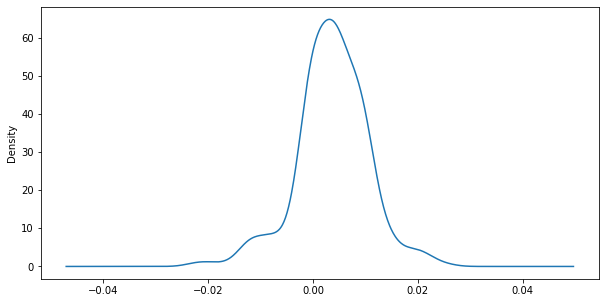

In [162]:
housing_series.plot.kde();

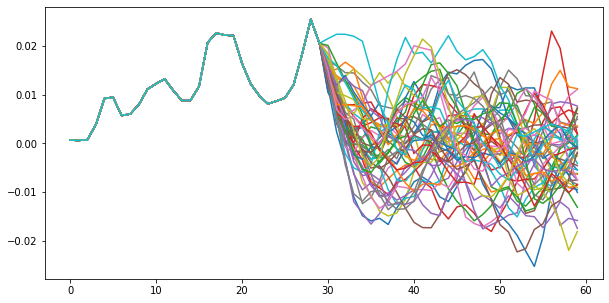

In [175]:
trajectory_length = 30
ar_deg = 2

model = sm.tsa.AutoReg(housing_series, ar_deg, trend='n').fit()

coeffs = list(reversed(model.params))

num_samples = 50

initial_values = np.array(housing_series.iloc[-trajectory_length:].values).reshape(1,-1)

values = np.broadcast_to(initial_values, (num_samples, trajectory_length))

std_dev = rmse(model.predict(), housing_series)

for i in range(trajectory_length):
    next_prediction = values[:,-ar_deg:] @ coeffs
    next_column = next_prediction + std_dev * np.random.randn(num_samples) 
    values = np.append(values, next_column.reshape(num_samples, 1), axis=1)
    
plt.plot(values.transpose());

In [176]:
arr = next_column

def prob_between(lower,higher):
    count = np.count_nonzero((arr > lower ) & (arr < higher)) 
    return count/arr.size

prob_between(0, 1)

0.4

In [177]:
prob_between(-1, 0)

0.6

Based on 50 simulations, we're seeing a slightly higher probability of home prices decreasing over this 30 day period than not. 

Given the effect of interest rates on home prices lately, this result looks reasonable.

# 5. Decompositions <a class="anchor" id="topic6"></a>

## Simple Moving Averages
To demonstrate simple moving averages, we will display several of them efficiently on one chart, rather than taking multiple charts for each moving average period.

The overarching idea is that the shorter the smoothing period, the closer the moving average tracks price. To get a greater smoothing effect, one must take longer periods.

Commonly used periods in trading include the 50 SMA, 100SMA and 200SMA. We will utilize these with Bitcoin price. Moving averages will be calculated with 1 week as 1 period. This will illustrate an interesting property of the 200 week simple moving average - it has been a historical support of Bitcoin price. In addition to that, price is currently just below the 200W SMA.

As always, plotly charts such as the one below can be zoomed in by clicking and dragging one's mouse. Hovering the cursor will display the values underneath. This makes it a good fit for dense charts like the below and charts spanning longer time periods.

In [178]:
def sma(df, obs_col, period):
    return df[obs_col].rolling(period).mean()

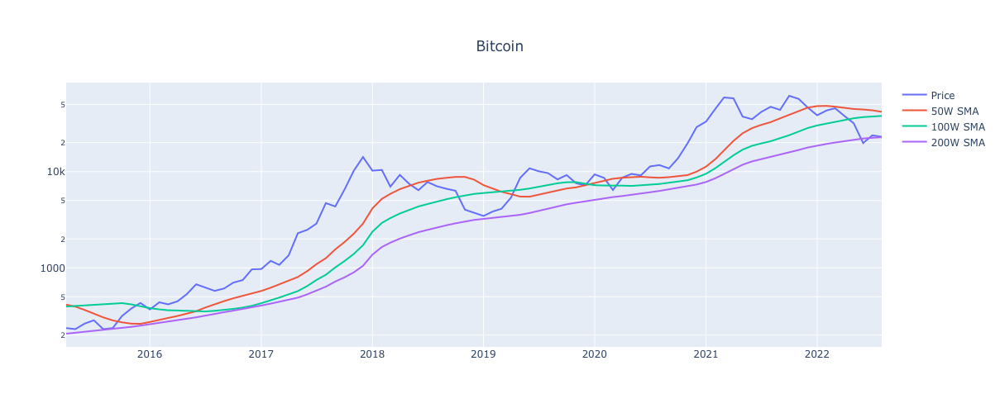

In [179]:
btc['sma50w'] = sma(btc_daily, 'Price', 350)
btc['sma100w'] = sma(btc_daily, 'Price', 700)
btc['sma200w'] = sma(btc_daily, 'Price', 1400)

fig = make_subplots(rows=1, cols=1)
fig.append_trace(go.Line(
    name="Price", x=btc.index, y=btc['Price']),
    row=1, col=1)                 
fig.append_trace(go.Line(
    name="50W SMA", x=btc.index, y=btc['sma50w']),
    row=1, col=1)
fig.append_trace(go.Line(
    name="100W SMA", x=btc.index, y=btc['sma100w']),
    row=1, col=1)
fig.append_trace(go.Line(
    name="200W SMA", x=btc.index, y=btc['sma200w']),
    row=1, col=1)
fig.update_yaxes(showgrid=True, type="log")
fig.update_layout(
    title={'text': "Bitcoin", 'y':0.9, 'x':0.5,'xanchor': 'center', 'yanchor': 'top'},
    height=500, width=1000, xaxis_rangeslider_visible=False)
fig.show()

We'll also look at SMA's for the M2 Money Supply. We'll look at the same MA periods as before, but since this data is monthly, they will be the 50-month simple moving average, 100-month simple moving average and 200-month simple moving average.

As you can see, the data itself is already so smooth, that adding the moving averages is not very useful.

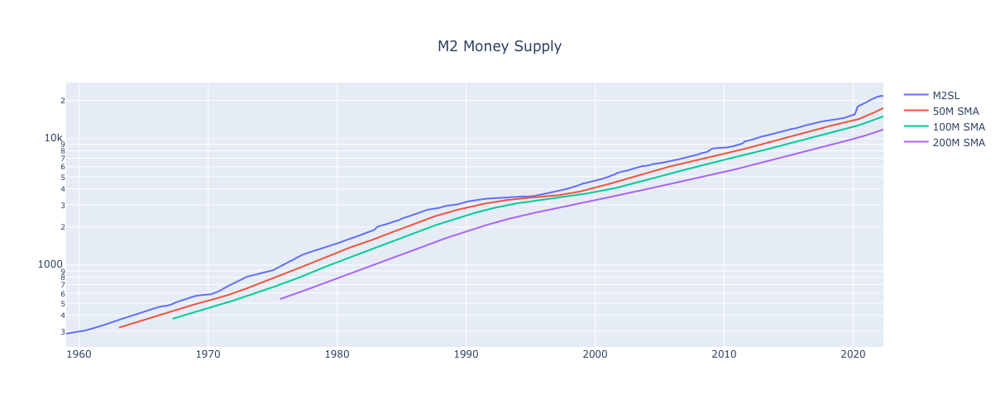

In [180]:
m2['sma50m'] = sma(m2, 'M2SL', 50)
m2['sma100m'] = sma(m2, 'M2SL', 100)
m2['sma200m'] = sma(m2, 'M2SL', 200)

fig = make_subplots(rows=1, cols=1)
fig.append_trace(go.Line(
    name="M2SL", x=m2.index, y=m2['M2SL']),
    row=1, col=1)                 
fig.append_trace(go.Line(
    name="50M SMA", x=m2.index, y=m2['sma50m']),
    row=1, col=1)
fig.append_trace(go.Line(
    name="100M SMA", x=m2.index, y=m2['sma100m']),
    row=1, col=1)
fig.append_trace(go.Line(
    name="200M SMA", x=m2.index, y=m2['sma200m']),
    row=1, col=1)
fig.update_yaxes(showgrid=True, type="log")
fig.update_layout(
    title={'text': "M2 Money Supply", 'y':0.9, 'x':0.5,'xanchor': 'center', 'yanchor': 'top'},
    height=500, width=1000, xaxis_rangeslider_visible=False)
fig.show()

## Exponential Moving Averages

Unlike simple moving averages above, which account for only a few prior items and weights them equally, exponential moving averages take into account all previous data but weights older items in an exponentially decaying fashion.

This time, we'll observe Bitcoin price data from just the past 6 months and M2 for the last 5 years, as our exponential moving averages will run closer to prices and woudln't be very visible on the higher time frames.

In [181]:
def ema(df, obs_col, alpha): 
    return df[obs_col].ewm(alpha=alpha, adjust=False).mean()

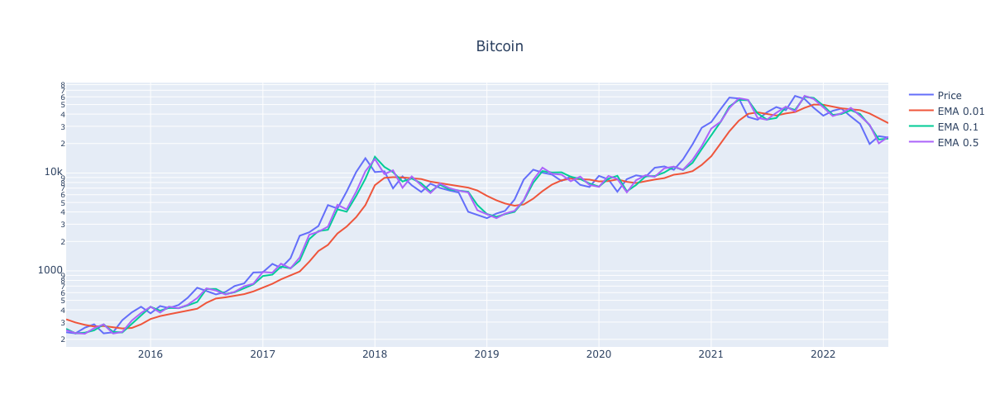

In [182]:
btc['ema01'] = ema(btc_daily, 'Price', 0.01)
btc['ema1'] = ema(btc_daily, 'Price', 0.1)
btc['ema5'] = ema(btc_daily, 'Price', 0.5)

btc_sample = btc[-180:]

fig = make_subplots(rows=1, cols=1)
fig.append_trace(go.Line(
    name="Price", x=btc_sample.index, y=btc_sample['Price']),
    row=1, col=1)                 
fig.append_trace(go.Line(
    name="EMA 0.01", x=btc_sample.index, y=btc_sample['ema01']),
    row=1, col=1)
fig.append_trace(go.Line(
    name="EMA 0.1", x=btc_sample.index, y=btc_sample['ema1']),
    row=1, col=1)
fig.append_trace(go.Line(
    name="EMA 0.5", x=btc_sample.index, y=btc_sample['ema5']),
    row=1, col=1)
fig.update_yaxes(showgrid=True, type="log")
fig.update_layout(
    title={'text': "Bitcoin", 'y':0.9, 'x':0.5,'xanchor': 'center', 'yanchor': 'top'},
    height=500, width=1000, xaxis_rangeslider_visible=False)
fig.show()

For clarity, here's a smoothed view of the Bitcoin price history via the EMA with alpha 0.01 (aka exponential decomposition).

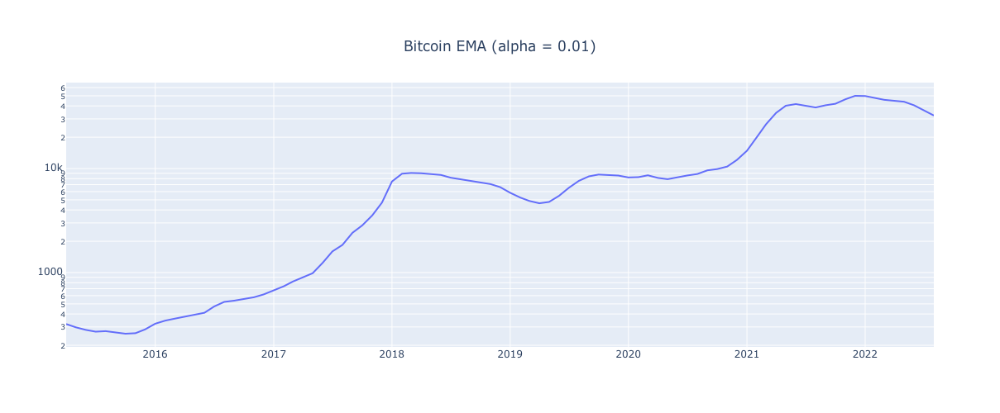

In [183]:
btc['ema01'] = ema(btc_daily, 'Price', 0.01)
btc['ema1'] = ema(btc_daily, 'Price', 0.1)
btc['ema5'] = ema(btc_daily, 'Price', 0.5)

fig = make_subplots(rows=1, cols=1)
fig.append_trace(go.Line(
    name="EMA 0.01", x=btc.index, y=btc['ema01']),
    row=1, col=1)
fig.update_yaxes(showgrid=True, type="log")
fig.update_layout(
    title={'text': "Bitcoin EMA (alpha = 0.01)", 'y':0.9, 'x':0.5,'xanchor': 'center', 'yanchor': 'top'},
    height=500, width=1000, xaxis_rangeslider_visible=False)
fig.show()

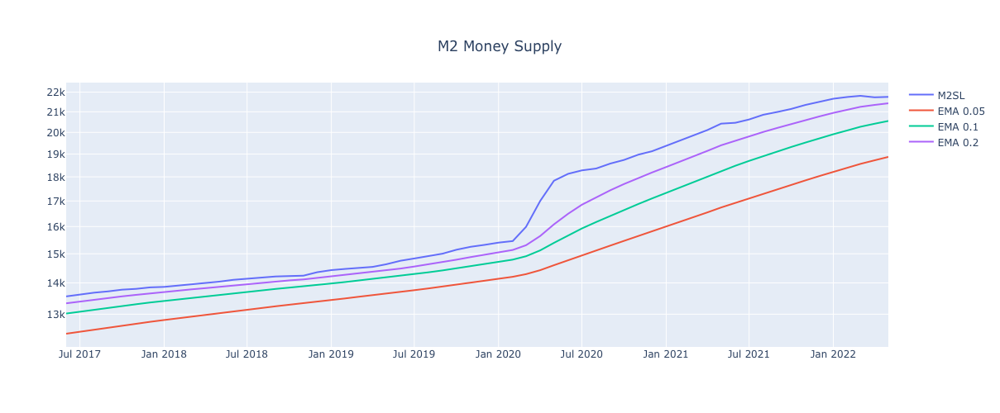

In [184]:
m2['ema05'] = ema(m2, 'M2SL', 0.05)
m2['ema1'] = ema(m2, 'M2SL', 0.1)
m2['ema2'] = ema(m2, 'M2SL', 0.2)

m2_sample = m2.iloc[-60:]

fig = make_subplots(rows=1, cols=1)
fig.append_trace(go.Line(
    name="M2SL", x=m2_sample.index, y=m2_sample['M2SL']),
    row=1, col=1)                 
fig.append_trace(go.Line(
    name="EMA 0.05", x=m2_sample.index, y=m2_sample['ema05']),
    row=1, col=1)
fig.append_trace(go.Line(
    name="EMA 0.1", x=m2_sample.index, y=m2_sample['ema1']),
    row=1, col=1)
fig.append_trace(go.Line(
    name="EMA 0.2", x=m2_sample.index, y=m2_sample['ema2']),
    row=1, col=1)
fig.update_yaxes(showgrid=True, type="log")
fig.update_layout(
    title={'text': "M2 Money Supply", 'y':0.9, 'x':0.5,'xanchor': 'center', 'yanchor': 'top'},
    height=500, width=1000, xaxis_rangeslider_visible=False)
fig.show()

### Prediction

Lets see how predictions using exponential smoothing compare to naive predictions. We'll run a PACF to get a good parameter for the autoregression. This turns out to be 2.

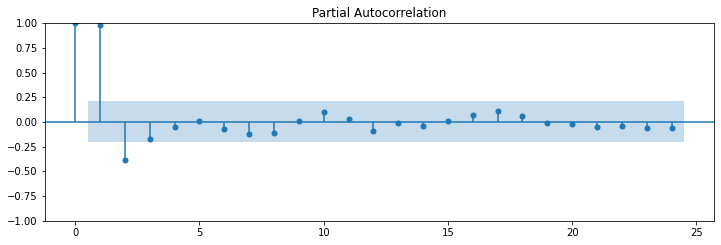

In [185]:
fig = plt.figure(figsize=(12,8))
ax2 = fig.add_subplot(212)
fig = sm.graphics.tsa.plot_pacf(btc['ema01'], lags=24, ax=ax2, method='ywm')

In [186]:
def pred_ema(df, obs_col, alpha, dropna=False): 
    df['ema'] = ema(df, obs_col, alpha)
    df['res ema'] = df[obs_col] - df['ema']
    df['res diff'] = df['res ema'] - df['res ema'].shift()
    df.dropna(inplace=True)
              
    coeffs = train_ar(df['res diff'], 2)

    df_temp = df['res diff'].to_frame()
    resdiff_pred = predict(coeffs, df_temp)
    resdiff_pred = resdiff_pred + df['res diff'].shift()
    
    trend_diffs = (df['ema'].shift() - df['ema'].shift(2)) 
    trend_pred = df['ema'].shift(1) + trend_diffs

    df['pred_ema'] = trend_pred + resdiff_pred
    
    if dropna:
        df.dropna(inplace=True)
    
    return df

btc = pred_ema(btc_daily, 'Price', 0.5, dropna=True)

print('Naive RMSE:', rmse_table['pred_naive'].loc['btc'])
print('EMA predicted RMSE:', rmse(btc['pred_ema'], btc['Price']))

Naive RMSE: 5415.059705195153
EMA predicted RMSE: 728.3936437532227


This is a great result, substantially improving on the naive RMSE.

## Lowess

LOWESS (Locally Weighted Scatterplot Smoothing), sometimes called LOESS (Locally Weighted Smoothing), provides another smoothing technique, based on moving windows.

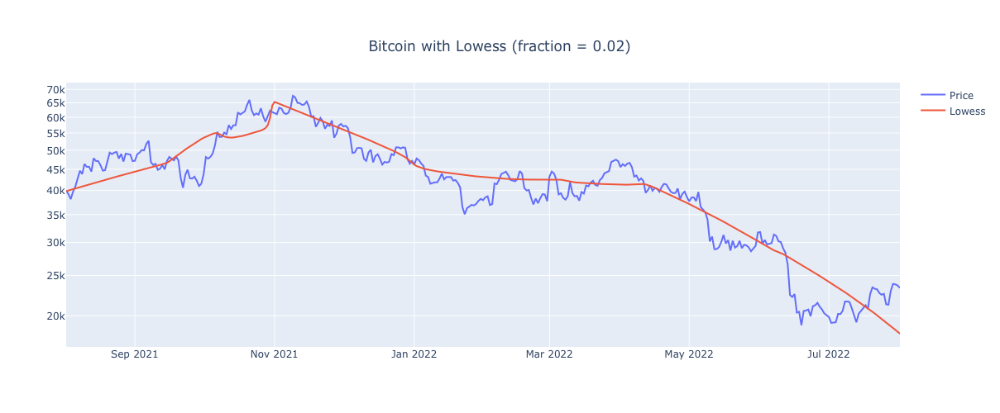

In [187]:
lowess = sm.nonparametric.lowess

btc['lowess'] = lowess(btc_daily['Price'], btc_daily.index, frac=0.02)[:,1]
btc['residual_lowess'] = btc_daily['Price'] - btc['lowess']

btc_sample = btc.iloc[-365:]

fig = make_subplots(rows=1, cols=1)
fig.append_trace(go.Line(
    name="Price", x=btc_sample.index, y=btc_sample['Price']),
    row=1, col=1)
fig.append_trace(go.Line(
    name="Lowess", x=btc_sample.index, y=btc_sample['lowess']),
    row=1, col=1)

fig.update_yaxes(showgrid=True, type="log")
fig.update_layout(
    title={'text': "Bitcoin with Lowess (fraction = 0.02)", 'y':0.9, 'x':0.5,'xanchor': 'center', 'yanchor': 'top'},
    height=500, width=1000, xaxis_rangeslider_visible=False)
fig.show()

### Prediction

Lets see if LOWESS predictions can outperform EMAs from above.

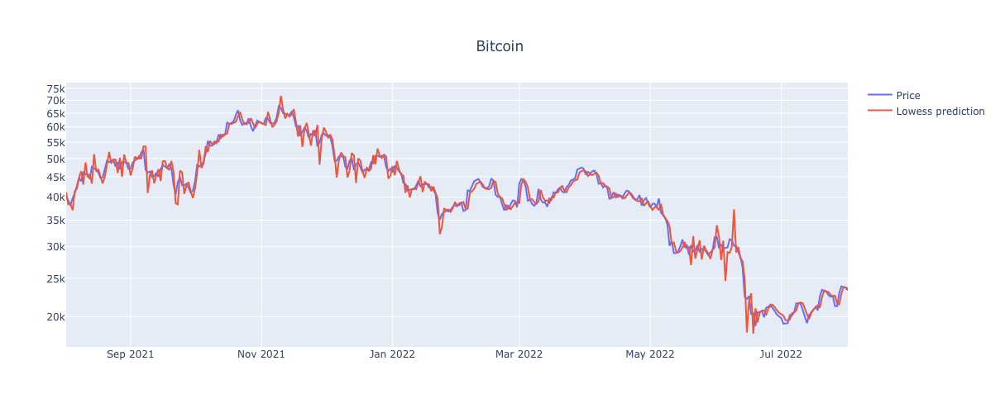

In [188]:
def pred_lowess(df, obs_col, frac, dropna=False): 
    df['lowess'] = lowess(df[obs_col], df.index, frac=frac)[:,1]
    df['residual_lowess'] = df[obs_col] - df['lowess']
    
    ar_model = AutoReg(df['residual_lowess'], lags = 3).fit()

    res_prediction = ar_model.predict()
    res_prediction.index = df.index

    trend_prediction = 2 * df['lowess'].shift(1) - df['lowess'].shift(2) # naive differences

    df['pred_lowess'] = trend_prediction + res_prediction
    
    if dropna:
        df = df.dropna()
    
    return df

btc = pred_lowess(btc_daily, 'Price', 0.01)

btc_sample = btc.iloc[-365:]

fig = make_subplots(rows=1, cols=1)
fig.append_trace(go.Line(
    name="Price", x=btc_sample.index, y=btc_sample['Price']),
    row=1, col=1)
fig.append_trace(go.Line(
    name="Lowess prediction", x=btc_sample.index, y=btc_sample['pred_lowess']),
    row=1, col=1)

fig.update_yaxes(showgrid=True, type="log")
fig.update_layout(
    title={'text': "Bitcoin", 'y':0.9, 'x':0.5,'xanchor': 'center', 'yanchor': 'top'},
    height=500, width=1000, xaxis_rangeslider_visible=False)
fig.show()

In [189]:
print('Naive RMSE:', rmse_table['pred_naive'].loc['btc'])
print('Lowess predicted RMSE:', rmse(btc['pred_lowess'], btc['Price']))

Naive RMSE: 5415.059705195153
Lowess predicted RMSE: 846.1788258484181


No improvement over the EMA predictions, though still much better than the naive method.

Lets view a Lowess prediction on some different data, which we haven't viewed for awhile - annual temperatures in Charlotte. We'll also show plots of fraction values on either end of the extreme to see how they change the prediction.

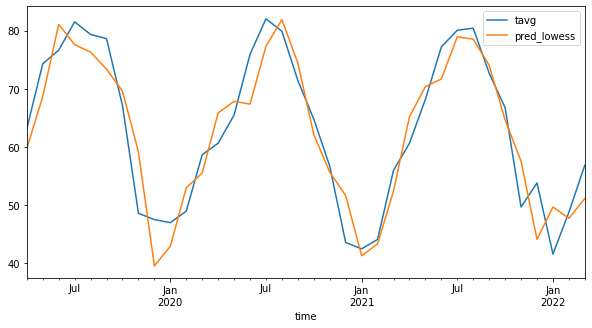

In [190]:
weather = pred_lowess(weather, 'tavg', 0.999)

weather[['tavg', 'pred_lowess']].iloc[-36:].plot();

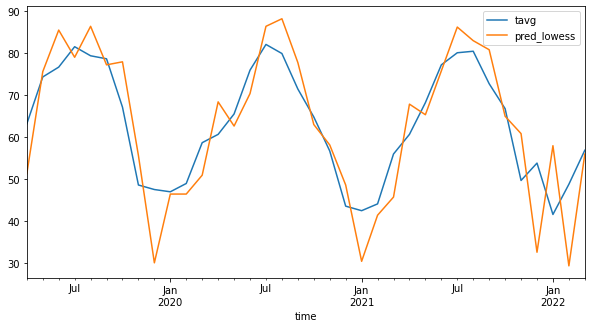

In [191]:
weather = pred_lowess(weather, 'tavg', 0.001)

weather[['tavg', 'pred_lowess']].iloc[-36:].plot();

## Fourier Transforms

We'll briefly visualize a Fourier Tranform and its power in decomposing a series, using the widely used technique of Fast Fourier Transform (FFT).

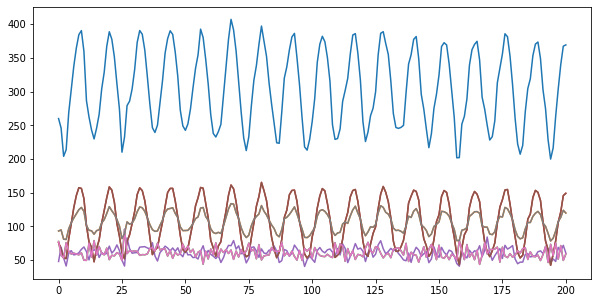

In [192]:
weather_fft = weather['tavg'].to_frame()

weather_fft = np.abs(np.fft.fft((weather)))[10:len(weather)//2] 
plt.plot(weather_fft);
plt.rcParams['figure.figsize'] = [15,5]

## STL

To illustrate the power of the Fourier Transform, we'll now carry out predictions with STLs, which are based on the FFT. We will first create an standard AutoRegression, then create the STL prediction, and finally compare the two. (Spoiler, the STL does much better!)

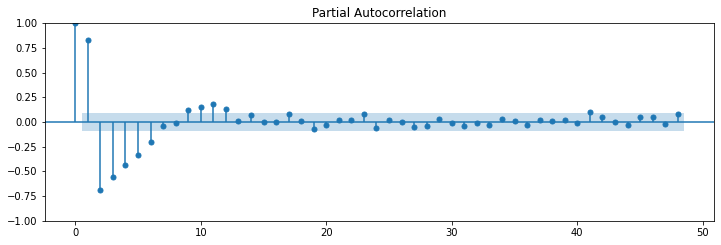

In [193]:
## Create AutoRegression

fig = plt.figure(figsize=(12,8))
ax2 = fig.add_subplot(212)
fig = sm.graphics.tsa.plot_pacf(weather['tavg'], lags=48, ax=ax2, method='ywm')

In [194]:
coeffs = train_ar(weather['tavg'],11)
ar_predict_whole = predict(coeffs, weather['tavg'].to_frame())

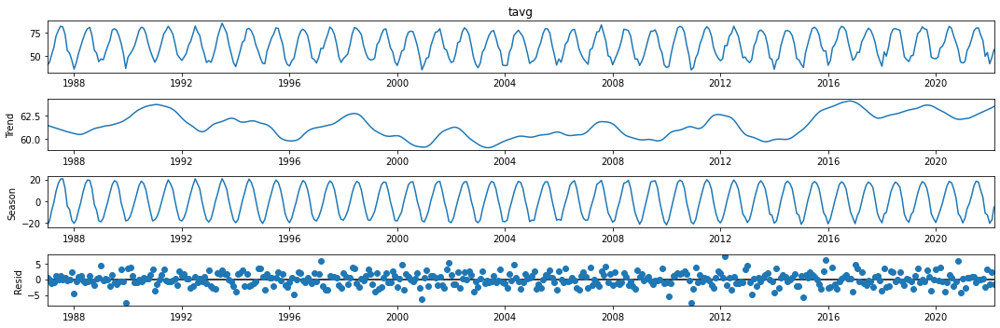

In [195]:
## Create STL

weather_decomposed = STL(weather['tavg']).fit()

weather_trend = weather_decomposed.trend
weather_seasonal = weather_decomposed.seasonal
weather_resid = weather_decomposed.resid

weather_decomposed.plot();

This shows the trend varying within a less than 5 degree band over the last 35 years. It shows temperatures slightly declining in the 2000s before slightly raising again in the last 10 years.

Naturally, the vast majority of differences come from the seasonality of the data.

Residuals all fall within a roughly 10 degree band.

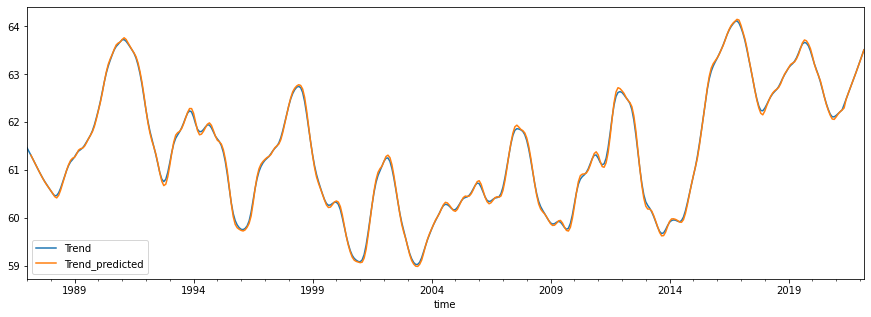

In [196]:
trend_pred = 2 * weather_trend.shift() - weather_trend.shift(2) # naive differences

df = pd.DataFrame({ 'Trend': weather_trend, 'Trend_predicted': trend_pred })

df.plot();

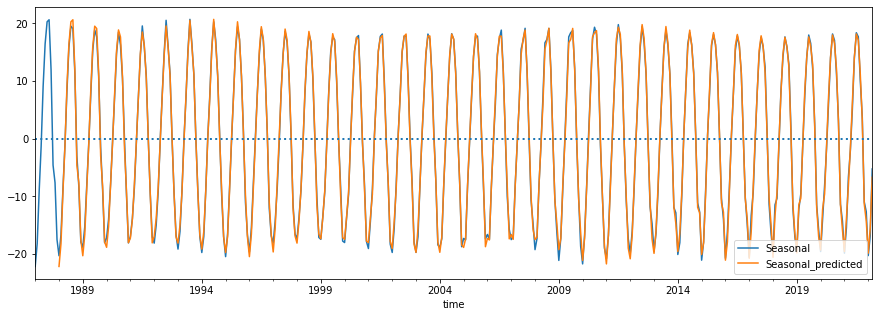

In [197]:
seasonal_pred = weather_seasonal.shift(12) # seasonal naive

df = pd.DataFrame({ 'Seasonal': weather_seasonal, 'Seasonal_predicted': seasonal_pred })

df.plot();
plt.axhline(y=0, xmin=0, linestyle='dotted', linewidth=2);

To predict residuals, we'll need to get an appropriate AR parameter again, which will be 12 based on the below.

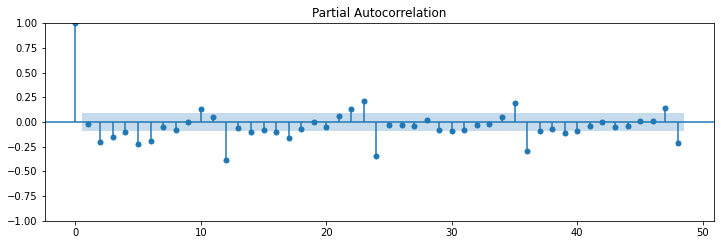

In [198]:
fig = plt.figure(figsize=(12,8))
ax2 = fig.add_subplot(212)
fig = sm.graphics.tsa.plot_pacf(weather_resid, lags=48, ax=ax2, method='ywm')

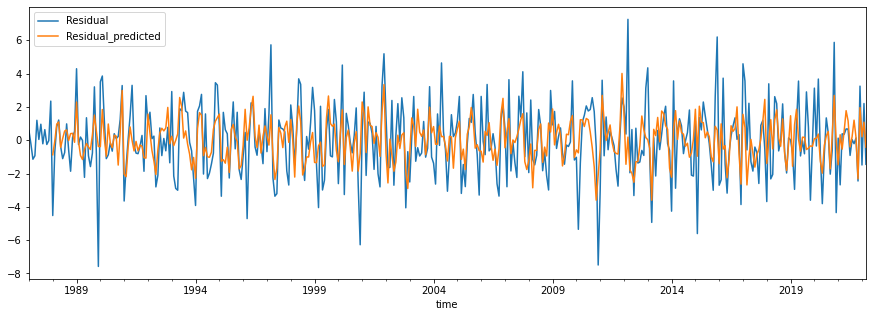

In [199]:
coeffs = train_ar(weather_resid,12)
resid_pred = predict(coeffs, weather_resid.to_frame())

df = pd.DataFrame({ 'Residual': weather_resid, 'Residual_predicted': resid_pred })

df.plot();

In [200]:
weather['pred_stl'] = weather_trend + weather_seasonal + weather_resid

print("STL combined RMSE", rmse(trend_pred + seasonal_pred +resid_pred, weather['tavg']))
print("AR(11) RMSE", rmse(ar_predict_whole, weather['tavg']))

STL combined RMSE 1.9537179763707109
AR(11) RMSE 3.320481524729526


The performance of the STL is almost twice as good as the AR(11) model! This is an incredibly exciting result.

### Housing data
Lets try it now on housing data.

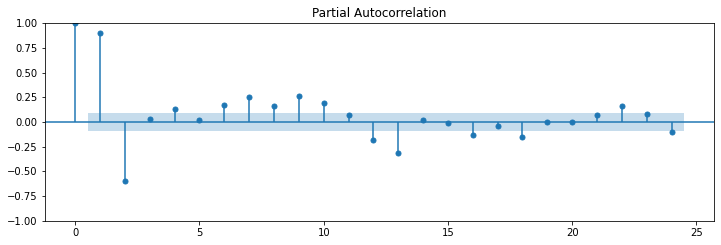

In [201]:
## Create AutoRegression

fig = plt.figure(figsize=(12,8))
ax2 = fig.add_subplot(212)
fig = sm.graphics.tsa.plot_pacf(housing['log diff'], lags=24, ax=ax2, method='ywm')

In [202]:
coeffs = train_ar(housing['log diff'],2)
ar_predict_whole = predict(coeffs, housing['log diff'].to_frame())

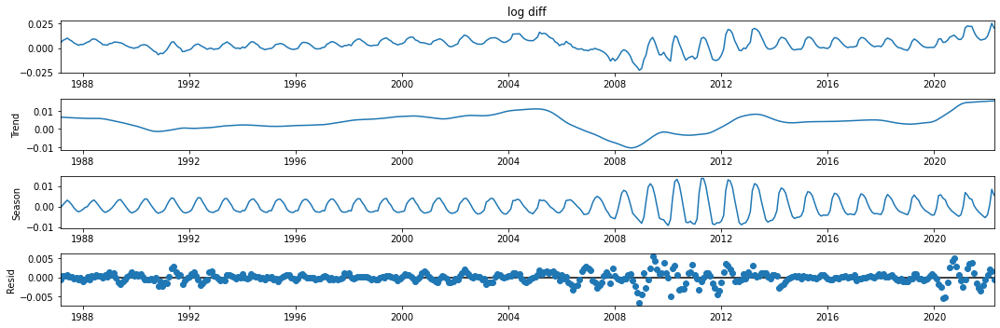

In [203]:
## Create STL

decomposed = STL(housing['log diff']).fit()

trend = decomposed.trend
seasonal = decomposed.seasonal
resid = decomposed.resid

decomposed.plot();

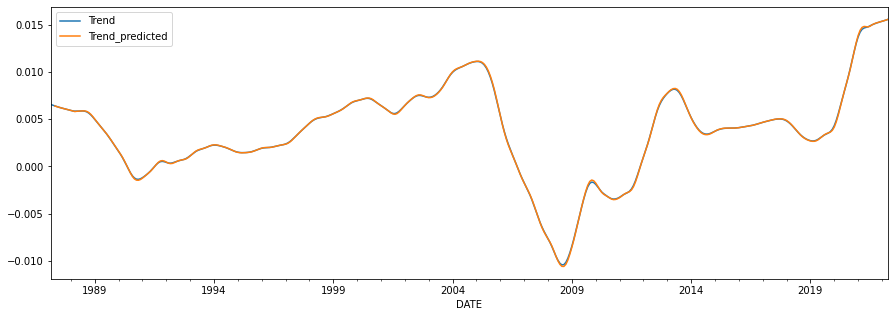

In [204]:
trend_pred = 2 * trend.shift() - trend.shift(2) # naive differences

df = pd.DataFrame({ 'Trend': trend, 'Trend_predicted': trend_pred })

df.plot();

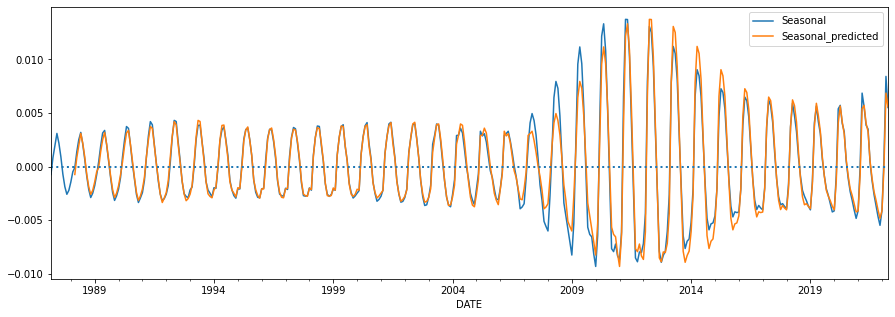

In [205]:
seasonal_pred = seasonal.shift(12) # seasonal naive

df = pd.DataFrame({ 'Seasonal': seasonal, 'Seasonal_predicted': seasonal_pred })

df.plot();
plt.axhline(y=0, xmin=0, linestyle='dotted', linewidth=2);

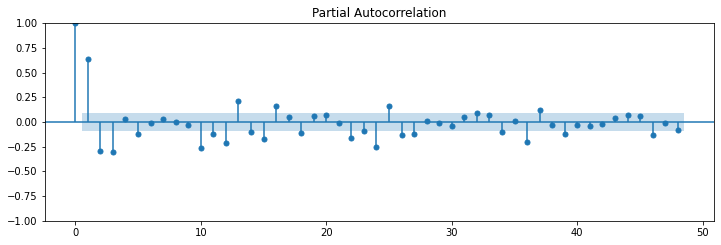

In [206]:
fig = plt.figure(figsize=(12,8))
ax2 = fig.add_subplot(212)
fig = sm.graphics.tsa.plot_pacf(resid, lags=48, ax=ax2, method='ywm')

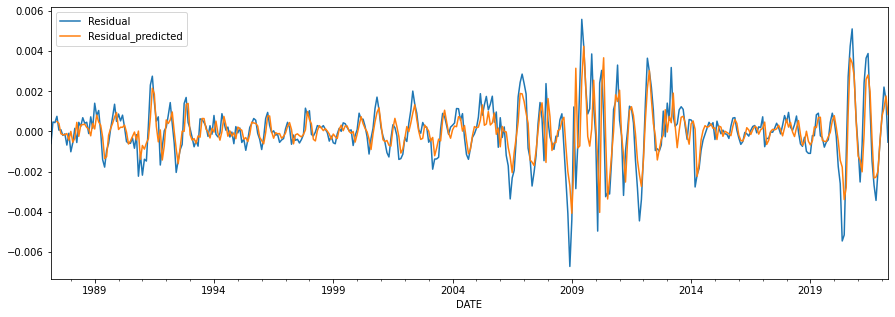

In [207]:
coeffs = train_ar(resid,3)
resid_pred = predict(coeffs, resid.to_frame())

df = pd.DataFrame({ 'Residual': resid, 'Residual_predicted': resid_pred })

df.plot();

In [208]:
housing['pred_stl'] = trend + seasonal + resid

print("STL combined RMSE", rmse(trend_pred + seasonal_pred +resid_pred, housing['log diff']))
print("AR(11) RMSE", rmse(ar_predict_whole, housing['log diff']))

STL combined RMSE 0.00130435679907385
AR(11) RMSE 0.002305837421355259


And again, the STL outperforms the AutoRegression by nearly a factor of 2! These are incredible results, particularly in that housing data, while being seasonal, is substantially less so than the temperature data before. Even so, the STL outperformed by the same margin.

# 6. ARIMA<a class="anchor" id="topic7"></a>

## Calculating ARMA coefficients with linear regression and gradient descent

We'll compare the results from gradient descent and Hannen-Risannen below. Since both require lag values, we'll start by determining AutoRegression lag through running a PACF plot. With Moving Averages in the mix, we'll test for an appropriate lag there as well, using an ACF plot.

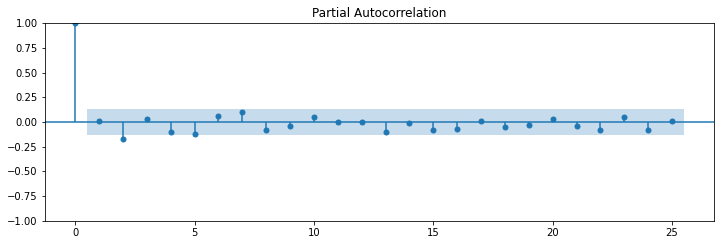

In [209]:
fig = plt.figure(figsize=(12,8))
ax2 = fig.add_subplot(212)
fig = sm.graphics.tsa.plot_pacf(stocks['Real stock return'], lags=25, ax=ax2, method='ywm')

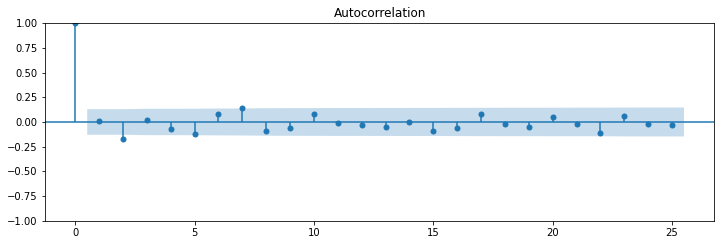

In [210]:
fig = plt.figure(figsize=(12,8))
ax2 = fig.add_subplot(212)
fig = sm.graphics.tsa.plot_acf(stocks['Real stock return'], lags=25, ax=ax2)

In [211]:
def arma_coeffs_w_grad_descent(df, obs_col, ar_deg, ma_deg):

    ar_coef = train_ar(df[obs_col], ar_deg)

    ma_coef = np.zeros(ma_deg) 
    learning_rate = 0.0001

    for x in range(15):
        ma_grad_total = np.zeros(ma_deg) 
        last_errors = [0] * ma_deg 
        predicted = [math.nan] * ar_deg

        for i in range (len(df[obs_col]) - ar_deg):
            ar_pred = np.dot(ar_coef, df[obs_col][i:i+ar_deg]) 
            ma_pred = np.dot(ma_coef, last_errors)
            pred = ar_pred + ma_pred 
            predicted.append(pred)

            observed = df[obs_col][i+ar_deg]
            error = (observed - pred)
            ma_pred_grad = np.array(last_errors)
            last_errors = last_errors[1:] + [error]
            ma_grad_total = ma_grad_total - 2 * (ma_pred_grad * (observed - pred))

        ma_grad = ma_grad_total/ (len(df[obs_col]) - ar_deg) 
        ma_coef = ma_coef - ma_grad * learning_rate

        if (x % 10) == 0:
            print("Step", x, rmse(predicted, df[obs_col]), ma_coef)
        elif x == 14:
            print('\nFinal RMSE:', rmse(predicted, df[obs_col]))    
            
    return ar_coef, ma_coef

ar_coef, ma_coef = arma_coeffs_w_grad_descent(stocks, 'Real stock return', 2, 2)

print('AR Coefficients:', ar_coef)
print('MA Coefficients:', ma_coef)

Step 0 0.17992724226002954 [-2.19163700e-07  1.02124056e-08]
Step 10 0.17992722888412052 [-2.41071780e-06  1.12346388e-07]

Final RMSE: 0.17992722353428225
AR Coefficients: [-0.00771829  0.18271396]
MA Coefficients: [-3.28729724e-06  1.53205034e-07]


## Calculating ARMA coefficients with linear regression and Hannan-Rissanen

In [212]:
def linear_regression(design_matrix, target_vector):
    return np.linalg.inv(design_matrix.transpose() @ design_matrix) @ design_matrix.transpose() @ target_vector

def arma_coeffs_w_hannan_rissanen(df, obs_col, ar_deg, ma_deg):
    coef = np.append(train_ar(df[obs_col], ar_deg), np.zeros(ma_deg))
    errors = [0.0] * len(df[obs_col])

    for x in range(15):
        design_matrix_rows = []
        for i in range(max(ar_deg, ma_deg), len(df[obs_col])):
            values = np.append(df[obs_col][i-ar_deg:i], errors[i-ma_deg:i])
            pred = np.dot(values, coef)
            design_matrix_rows.append(values)
            errors[i] = df[obs_col][i] - pred
        design_matrix = np.array(design_matrix_rows)
        coef = linear_regression(design_matrix, df[obs_col][max(ar_deg, ma_deg):])
        rmse = np.sqrt(np.dot(errors, errors)/(len(errors) - max(ar_deg, ma_deg)))
        
        if (x % 10) == 0:
            print("step", x, ":", rmse, coef)
        elif x == 14:
            print('\nFinal RMSE:', rmse)    
        
    return ar_coef, ma_coef
    
ar_coef, ma_coef = arma_coeffs_w_hannan_rissanen(stocks, 'Real stock return', 2, 2)

print('AR Coefficients:', ar_coef)
print('MA Coefficients:', ma_coef)

step 0 : 0.1799272422600296 [ 0.76568116  1.65271211 -1.07489887 -1.46599253]
step 10 : 0.36445005560012306 [ 0.05446479  0.2926367  -0.02858762 -0.11706602]

Final RMSE: 0.17941455920427496
AR Coefficients: [-0.00771829  0.18271396]
MA Coefficients: [-3.28729724e-06  1.53205034e-07]


With this data, the Hannen-Risannen method produced a marginally lower RMSE. However, the RMSE values were more unstable, requiring more attention.

Updating the RMSE table, we can see this is an improvement over the naive method, but it is edged out by the average prediction method.

In [213]:
rmse_table['pred_arma'] = np.nan
rmse_table['pred_arma']['stocks_ld'] = 0.1794
rmse_table.loc['stocks_ld']

pred_naive             0.210175
pred_seasonal_naive    0.210175
pred_average           0.174074
pred_diff_average      0.233802
pred_ar                     NaN
pred_arma                0.1794
Name: stocks_ld, dtype: object

For the sake of completeness, we'll run the Augmented Dickey Fuller test on this dataset, to test for stationarity. However, the data is already essentially log differences and the strong assumption is that it is stationary.

The p-value below, being so far below 0.05, confirms this.

In [214]:
adf_test = adfuller(stocks['Real stock return'])
print('ADF test p-value:', adf_test[1])

ADF test p-value: 2.1173084651456373e-23


## S&P500 Data

Lets try this entire method on a similar dataset - S&P500 - but using Prices rather than Price diffs, which are gauranteed not to be stationary. This will likely require doing the integration step, i.e. using a full ARIMA model as opposed to just an ARMA model above. The ADF test confirms this with a p-value of 0.99! When running the ADF test again on the log differences, we get a p-value of 0, as expected.

Based on the below we will choose an AR lag of 4 and an MA lag of 30.

We will also take the opportunity to implement this in statsmodels.

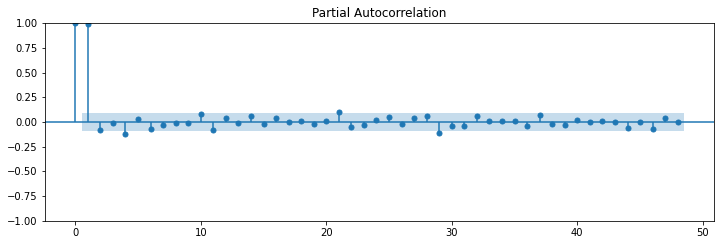

In [215]:
fig = plt.figure(figsize=(12,8))
ax2 = fig.add_subplot(212)
fig = sm.graphics.tsa.plot_pacf(sp500['Adj Close'], lags=48, ax=ax2, method='ywm')

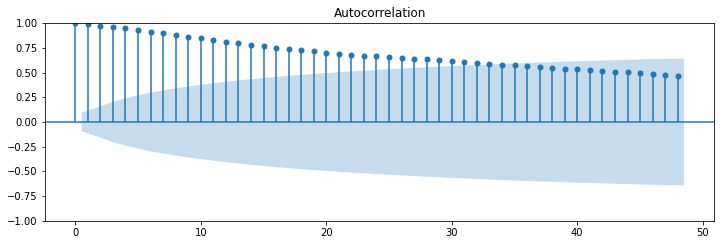

In [216]:
fig = plt.figure(figsize=(12,8))
ax2 = fig.add_subplot(212)
fig = sm.graphics.tsa.plot_acf(sp500['Adj Close'], lags=48, ax=ax2)

In [217]:
sp500.dropna(inplace=True)

adf_test = adfuller(sp500['Adj Close'])
print('ADF test p-value of Price:', adf_test[1])

ADF test p-value of Price: 0.9917643617903261


In [218]:
adf_test = adfuller(sp500['log diff'])
print('ADF test p-value of log difference:', adf_test[1])

ADF test p-value of log difference: 0.0


In [219]:
model = sm.tsa.arima.ARIMA(sp500['Adj Close'], order=(2,1,30), trend='n') 
res = model.fit()
# print(res.summary())
sp500['pred_arima'] = res.predict()

rmse_table['pred_arima'] = np.nan
rmse_table['pred_arima'].loc['sp500'] = rmse(sp500['Adj Close'], sp500['pred_arima'])

rmse_table.loc['sp500']

pred_naive              74.707185
pred_seasonal_naive    280.166728
pred_average           108.176922
pred_diff_average       78.423174
pred_ar                       NaN
pred_arma                     NaN
pred_arima              66.447591
Name: sp500, dtype: object

Go ARIMA! This model was the first to beat a naive prediction.

Given that this is stock data, this is a significant feat!

# Additional Topics 

# 7. SARIMA <a class="anchor" id="extra"></a>

Just as ARIMA built on the ARMA model, SARIMA builds on ARIMA, by taking seasonality into account. The function takes the form:

![img](sarima.png)

We simply provide the same parameters as before, but one set is for the non-seasonal portion of the time series and the other is for the seasonal portion.

m is the number of seasonal periods in a year. For monthly datapoints, this would be 12.

For our seasonal dataset we will examine monthly housing prices. The PACF plot below shows the raw housing prices would not be amenable to AutoRegression.

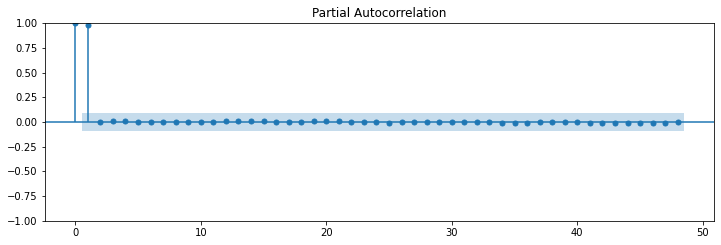

In [220]:
fig = plt.figure(figsize=(12,8))
ax2 = fig.add_subplot(212)
fig = sm.graphics.tsa.plot_pacf(housing['CSUSHPINSA'], lags=48, ax=ax2, method='ywm')

We'll try the log differences next. These look perfect.

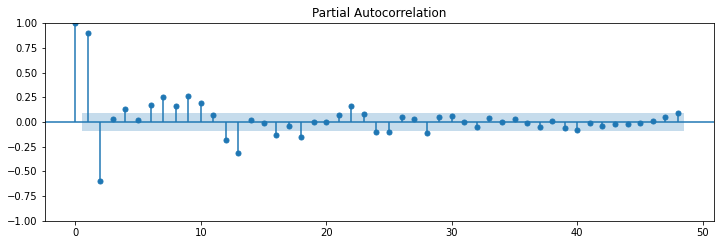

In [221]:
fig = plt.figure(figsize=(12,8))
ax2 = fig.add_subplot(212)
fig = sm.graphics.tsa.plot_pacf(housing['log diff'], lags=48, ax=ax2, method='ywm')

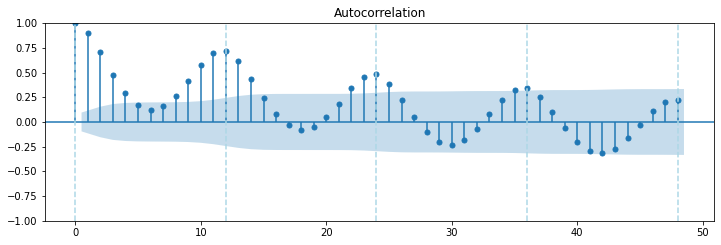

In [222]:
fig = plt.figure(figsize=(12,8))
ax2 = fig.add_subplot(212)
fig = sm.graphics.tsa.plot_acf(housing['log diff'], lags=48, ax=ax2)
xposition = [x for x in range(49) if x % 12 == 0]
for xc in xposition:
    plt.axvline(x=xc, color='lightblue', linestyle='--')

The above PACF plot supports an AR lag parameter of 2. 

In seasonal data, you expect peaks in the ACF plot on a periodic basis, decaying over subsequent periods. The above ACF plot shows this exact phenomenon with a period of 12, highlighted by the dashed lines. Choosing an MA parameter based on this ACF could be tricky. We'll come back to this in a second.

Based on the below ADF test of the log differences, we reject the null hypothesis and conclude the data is stationary.

In [223]:
adf_test = adfuller(housing['log diff'])
print('ADF test p-value of log difference:', adf_test[1])

ADF test p-value of log difference: 0.021609716698013558


We can see the annual seasonality clearly in the plot of the log difference values below.

We can also see some hetereoscadisticity. While the mean is mostly stable around 0, the variance changes over time. It was highest around the financial crisis, but even through the 2010s it settled into a level higher much higher than in the 1980's and 1990's.

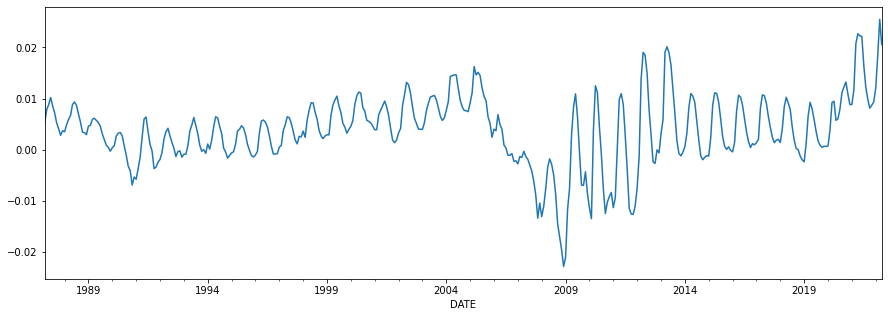

In [224]:
housing['log diff'].plot();

Now back to the Moving Average parameter. It is best to test a variety of values to see which perform best. 

In the simulated trading section above, grid search was referenced as a best practice. Now we will finally utilize it.

The integration parameter will be 1, since we're already taking log differences. For the remaining parameters, since we have a season involving 12 periods, we must test 12 values each. The problem - this leads to more than 20,000 parameter permutations to be tested! To deal with this issue, we will only test every 3 values in the space of 12. This brings the test space down to 256.

In [118]:
# Code snippet courtesy of https://towardsdatascience.com/time-series-forecasting-with-sarima-in-python-cda5b793977b

def optimize_SARIMA(parameters_list, d, D, s, exog):
    """
        Return dataframe with parameters, corresponding AIC and SSE
        
        parameters_list - list with (p, q, P, Q) tuples
        d - integration order
        D - seasonal integration order
        s - length of season
        exog - the exogenous variable
    """
    
    results = []
    
    for param in tqdm_notebook(parameters_list):
        try: 
            model = SARIMAX(exog, order=(param[0], d, param[1]), seasonal_order=(param[2], D, param[3], s)).fit(disp=-1)
        except:
            continue
            
        aic = model.aic
        results.append([param, aic])
        
    result_df = pd.DataFrame(results)
    result_df.columns = ['(p,q)x(P,Q)', 'AIC']
    
    #Sort in ascending order, lower AIC is better
    result_df = result_df.sort_values(by='AIC', ascending=True).reset_index(drop=True)
    
    return result_df

In [124]:
p = range(0,12,3)
d = 1
q = range(0,12,3)
P = range(0,12,3)
D = 1
Q = range(0,12,3)
s = 12

parameters = product(p, q, P, Q)
parameters_list = list(parameters)

result_df = optimize_SARIMA(parameters_list, d, D, s, housing['log diff'])
result_df

  0%|          | 0/256 [00:00<?, ?it/s]

,"(p,q)x(P,Q)",AIC
0,"(6, 0, 0, 3)",-3991.855152
1,"(3, 3, 0, 3)",-3989.986299
2,"(6, 3, 0, 3)",-3988.819451
3,"(0, 6, 0, 3)",-3988.382851
4,"(0, 9, 0, 3)",-3988.236366
...,...,...
251,"(9, 9, 6, 9)",-3793.165101
252,"(0, 0, 6, 9)",-3791.544886
253,"(6, 3, 3, 9)",-3786.705268
254,"(6, 3, 9, 9)",-3780.816413


In [225]:
best_model = SARIMAX(housing['log diff'], order=(6, 0, 0), seasonal_order=(6, 0, 0, 12)).fit(dis=-1)
print(best_model.summary())

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           13     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -4.69193D+00    |proj g|=  2.66757D+01


 This problem is unconstrained.



At iterate    5    f= -4.69293D+00    |proj g|=  1.14679D+01

At iterate   10    f= -4.72736D+00    |proj g|=  1.92402D+02

At iterate   15    f= -4.83175D+00    |proj g|=  2.84356D-01

At iterate   20    f= -4.83196D+00    |proj g|=  7.73995D+00

At iterate   25    f= -4.85128D+00    |proj g|=  5.28018D+01

At iterate   30    f= -4.88995D+00    |proj g|=  1.85767D+00

At iterate   35    f= -4.89061D+00    |proj g|=  1.51037D+00

At iterate   40    f= -4.89600D+00    |proj g|=  4.85839D+00

At iterate   45    f= -4.89720D+00    |proj g|=  6.73750D-02

At iterate   50    f= -4.89731D+00    |proj g|=  1.59381D+00

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

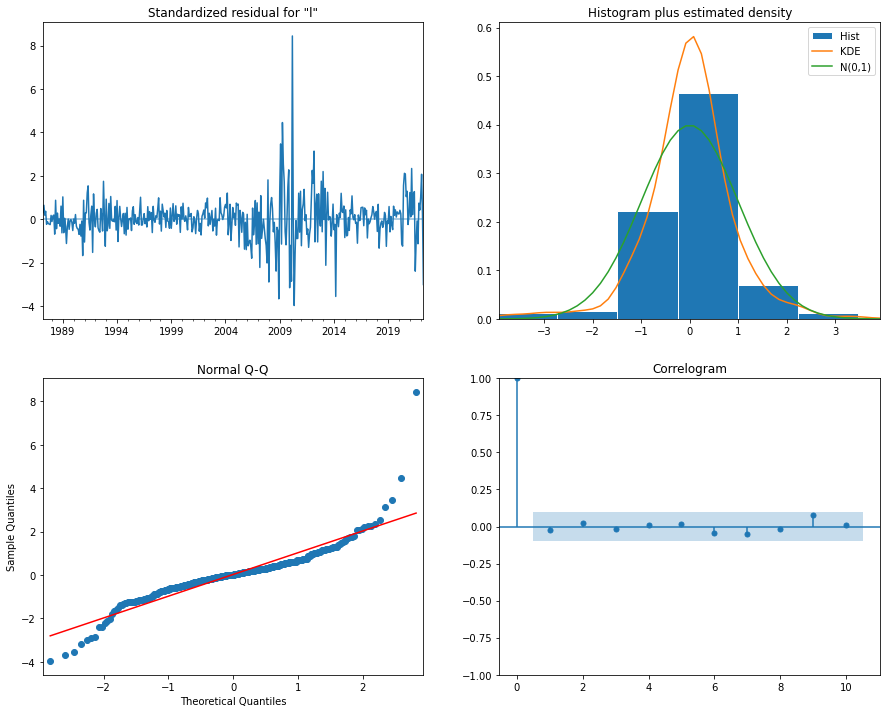

In [226]:
best_model.plot_diagnostics(figsize=(15,12));

The correlogram implies no autocorrelation in the residuals - they are effectively white noise.

The Normal Q-Q plot, has a mostly straight line, but diverges at the top end. Ideally the grid search should be run again, without skipping any parameter values, to see if a better model can be found. However, due to time restraints, this result will have to do.

In [227]:
housing['pred_sarima'] = np.nan
housing['pred_sarima'] = best_model.fittedvalues

In [228]:
rmse_table['pred_sarima'] = np.nan
rmse_table['pred_sarima'].loc['housing_ld'] = rmse(housing['log diff'], housing['pred_sarima'])

rmse_table.loc['housing_ld']

pred_naive             0.002689
pred_seasonal_naive    0.004257
pred_average           0.005188
pred_diff_average      0.003575
pred_ar                     NaN
pred_arma                   NaN
pred_arima                  NaN
pred_sarima            0.001779
Name: housing_ld, dtype: object

Go SARIMA! Just as the ARIMA model with stock data beat the naive baseline, the SARIMA model with housing data beat the naive prediction by a large margin. 

# 8. Prophet <a class="anchor" id="extra2"></a>

Just as we took the ARIMA concept further with the SARIMA above, we will now take the general STL concept further by exploring a front-end library created at Facebook.

[Prophet](https://facebook.github.io/prophet/) is a time series analysis and forecasting package, developed by Facebook's Core Data Science team, often considered one of the best Data Science teams in the world. They use it for the majority of their internal forecasting, and open-sourced it several years ago. According to them:

<blockquote>Prophet is a procedure for forecasting time series data based on an additive model where non-linear trends are fit with yearly, weekly, and daily seasonality, plus holiday effects. It works best with time series that have strong seasonal effects and several seasons of historical data. Prophet is robust to missing data and shifts in the trend, and typically handles outliers well.</blockquote>

Much like the STL model above, Prophet is the sum of three functions of time plus an error: 
- growth g(t), modelling the overall trend, which can be set as linear, logistic or flat
- seasonality s(t), which can include multiple seasonalities are different periods
- holidays h(t), whichh can add or subtract an effect on holidays based on past behavior on holidays
- an error e_t

One of the exciting features of Prophet is it's designed to work with real-world data and many of the warts that come with it. Unlike the STL model we worked with above, Prophet doesn't require input data to be stationary.

The dataframe will need to be contain the exact columns which prophet expects ('ds' as the index and 'y' as the data) so these will be created. 

We will provide a training set which is 99% of the data. This might seem extraordinaly high, but this dataset has 4363 datapoints. When we reserve 1% for predictions that still leaves 50 datapoints to be forecast. 

We can see Prophet provides 3 predictions - an overall prediction, an upper prediction and a lower prediction. Having the additional upper and lower bounds can be useful. For example, for trading purposes, as price approaches the lower bound that could be considered a buy signal. As it approaches the upper boundary, that would be considered a sell signal. The final plot in this section shows an oscillator plot that shows this more clearly.

The predicted values in the plot below are shown in red. The reader may wish to zoom in on this section of the plot for better visibility. As a reminder, this can be done with any Plotly chart by clicking and dragging the mouse.

In [229]:
def pred_prophet(df, obs_col, data_freq, train_length, prior, seasonality, period, fourier_order, log=False):
    data = df.copy()
    data['ds'] = data.index
    if log == True:
        data['y'] = np.log(data[obs_col])
    else:
        data['y'] = data[obs_col]

    # create test-train split and fit Prophet model
    data_train = data.iloc[:round(train_length * len(data))]
    data_test = data.iloc[round(train_length * len(data)):]
    
    prophet = Prophet.Prophet(changepoint_prior_scale=prior)
    prophet.add_seasonality(name=seasonality, period=period, fourier_order=fourier_order)
    prophet.fit(data_train)

    # create new dataframe with predictions
    forecast = prophet.make_future_dataframe(periods=len(data_test), freq=data_freq)
    forecast = prophet.predict(forecast)

    # update original dataframe with predictions    
    df['pred_prophet'] = np.nan
    df['pred_prophet_lower'] = np.nan
    df['pred_prophet_upper'] = np.nan
    
    if log == True:
        df['pred_prophet'] = np.exp(forecast['yhat'].values)
        df['pred_prophet_lower'] = np.exp(forecast['yhat_lower'].values)
        df['pred_prophet_upper'] = np.exp(forecast['yhat_upper'].values)
    else:
        df['pred_prophet'] = forecast['yhat'].values
        df['pred_prophet_lower'] = forecast['yhat_lower'].values
        df['pred_prophet_upper'] = forecast['yhat_upper'].values
    
    return data_train, data_test, df, forecast, prophet

data_train, data_test, btc, forecast, prophet = pred_prophet(btc, 'Price', 'D', 0.99, 0.0015, 'monthly', 30.5, 5, log=True)


18:31:58 - cmdstanpy - INFO - Chain [1] start processing
18:31:58 - cmdstanpy - INFO - Chain [1] done processing


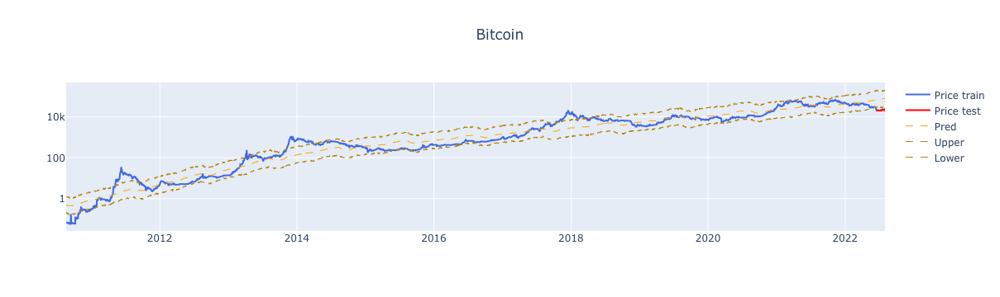

In [230]:
fig = go.Figure()

fig.add_trace(go.Line(
    name="Price train", x=data_train['ds'], y=data_train['Price'],
    line=dict(color='royalblue', width=2)
))
fig.add_trace(go.Line(
    name="Price test", x=data_test['ds'], y=data_test['Price'],
    line=dict(color='red', width=2)
))
fig.add_trace(go.Line(
    name="Pred", x=btc.index, y=btc['pred_prophet'],
    line=dict(color='orange', width=1, dash='dash')
))
fig.add_trace(go.Line(
    name="Upper", x=btc.index, y=btc['pred_prophet_upper'],
    line=dict(color='darkgoldenrod', width=1, dash='dash')
))
fig.add_trace(go.Line(
    name="Lower", x=btc.index, y=btc['pred_prophet_lower'],
    line=dict(color='darkgoldenrod', width=1, dash='dash')    
))

fig.update_yaxes(showgrid=True, type="log")
fig.update_layout(
    title={'text': "Bitcoin", 'y':0.9, 'x':0.5,'xanchor': 'center', 'yanchor': 'top'})
fig.show()

Prophet's prediction channel looks quite good. This is one of the reasons for chooshing the 0.0015 prior value, after trying multiple values. It yields a fairly good result. 

Granted, price has recently broken below the lower prediction, but that has also happened at prior price points.

Prophet also provides a handy set of plots breaking down the overall trend and seasonalities on multiple timeframes. From below we can see the strongest seasonality is annual, unsurprisingly. On average, an investor has stood to gain 20% by buying in January and selling in the summer. Or more than 40% if they bought in October and then sold in the summer.

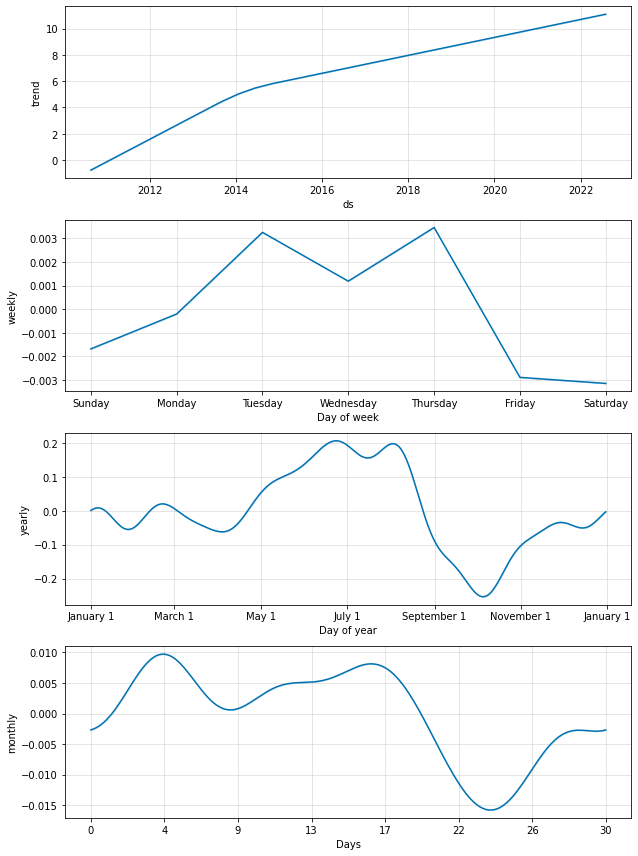

In [231]:
fig = prophet.plot_components(forecast)  
fig.show()  

The below error is quite high compared to the naive method. However, this should be expected. The naive method only predicts one day at a time, whereas we predicted 43 days past the end of the training data. 

In [232]:
print('Prophet RMSE:', rmse_eval(btc, 'Price', 'pred_prophet'))

print('Naive RMSE:', rmse_table['pred_naive'].loc['btc'])

Prophet RMSE: 9221.0805146608
Naive RMSE: 5415.059705195153


We'll try running prophet on the returns next. First, we'll take a quick look at the oscillator that was promised above. Dividing price by prophet's prediction creates a value which could easily be used in a long-term trading strategy. When the oscillator value is close to 0, the investor could accumulate. When the oscillator goes above a certain value, that would be treated as a time to take profit. The plot below adds lines for suggested values based on past trends.

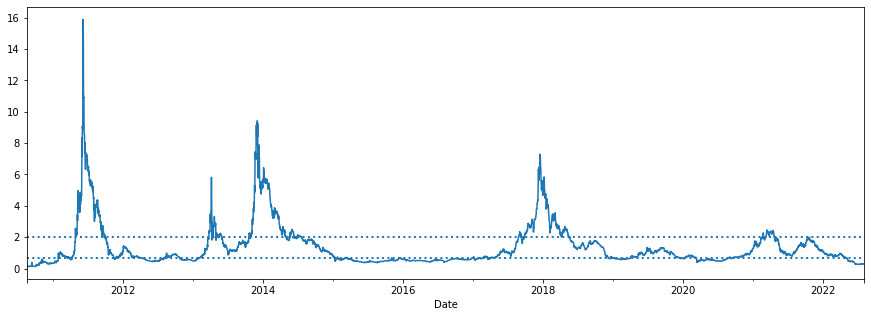

In [233]:
# The predicted values in the plot below are shown in red.

btc['oscillator'] = btc['Price'] / btc['pred_prophet']

btc['oscillator'].plot();
plt.axhline(y=2, xmin=0, linestyle='dotted', linewidth=2);
plt.axhline(y=0.7, xmin=0, linestyle='dotted', linewidth=2);

Lets run prophet on the returns now, a stationary form of this data, to see if it can perform any better.

18:32:12 - cmdstanpy - INFO - Chain [1] start processing
18:32:12 - cmdstanpy - INFO - Chain [1] done processing


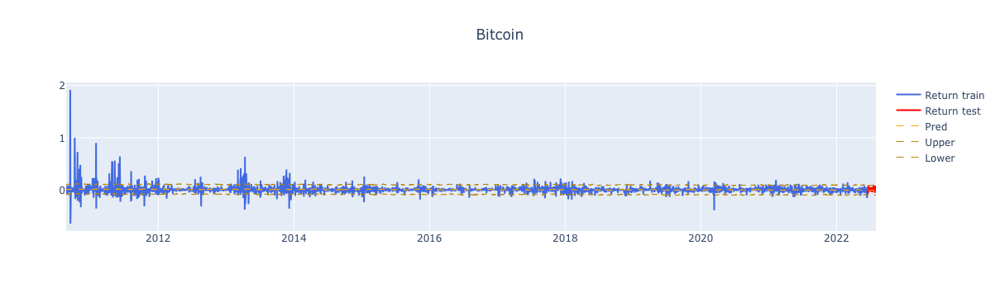

In [234]:
btc['Return'] = btc['Price'] / btc['Price'].shift() - 1
btc.dropna(inplace=True)

data_train, data_test, btc, forecast, prophet = pred_prophet(btc, 'Return', 'D', 0.99, 0.0015, 'monthly', 30.5, 5)

fig = go.Figure()

fig.add_trace(go.Line(
    name="Return train", x=data_train['ds'], y=data_train['Return'],
    line=dict(color='royalblue', width=2)
))
fig.add_trace(go.Line(
    name="Return test", x=data_test['ds'], y=data_test['Return'],
    line=dict(color='red', width=2)
))
fig.add_trace(go.Line(
    name="Pred", x=btc.index, y=btc['pred_prophet'],
    line=dict(color='orange', width=1, dash='dash')
))
fig.add_trace(go.Line(
    name="Upper", x=btc.index, y=btc['pred_prophet_upper'],
    line=dict(color='darkgoldenrod', width=1, dash='dash')
))
fig.add_trace(go.Line(
    name="Lower", x=btc.index, y=btc['pred_prophet_lower'],
    line=dict(color='darkgoldenrod', width=1, dash='dash')    
))

fig.update_yaxes(showgrid=True)
fig.update_layout(
    title={'text': "Bitcoin", 'y':0.9, 'x':0.5,'xanchor': 'center', 'yanchor': 'top'})
fig.show()

In [235]:
btc['pred_return_naive'] = pred_naive(btc, 'Return')['pred_naive'].values

print('Prophet RMSE:', rmse_eval(btc, 'Return', 'pred_prophet'))
print('Naive RMSE:', rmse_eval(btc, 'Return', 'pred_return_naive'))

# update RMSE table
rmse_table['pred_prophet'] = np.nan
rmse_table['pred_naive'].loc['btc_ld'] = rmse_eval(btc, 'Return', 'pred_return_naive')
rmse_table['pred_prophet'].loc['btc_ld'] = rmse_eval(btc, 'Return', 'pred_prophet')

Prophet RMSE: 0.08033036671094824
Naive RMSE: 0.12064444890009464


Another exciting result! Prophet predicts Bitcoin returns about 50% better than a simple naive method!

## CPI data

Lets try this on another non-stationary dataset, CPI. Since this data is monthly, whereas Bitcoin price was daily, we'll need to adjust some parameters. We'll keep a 99% training sample size, which will give a forecast size of 5 months.

18:32:35 - cmdstanpy - INFO - Chain [1] start processing
18:32:35 - cmdstanpy - INFO - Chain [1] done processing


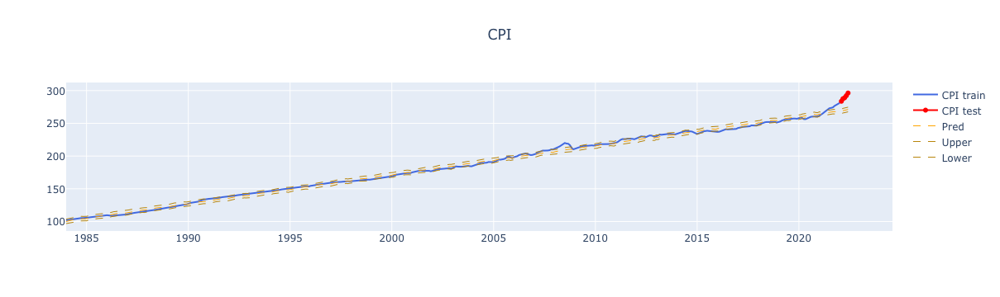

In [236]:
data_train, data_test, cpi, forecast, prophet = pred_prophet(cpi, 'CPIAUCNS', 'M', 0.99, 0.0015, 'annual', 365, 5)

fig = go.Figure()

fig.add_trace(go.Line(
    name="CPI train", x=data_train['ds'], y=data_train['y'],
    line=dict(color='royalblue', width=2)
))
fig.add_trace(go.Line(
    name="CPI test", x=data_test['ds'], y=data_test['y'],
    line=dict(color='red', width=2)
))
fig.add_trace(go.Line(
    name="Pred", x=cpi.index, y=cpi['pred_prophet'],
    line=dict(color='orange', width=1, dash='dash')
))
fig.add_trace(go.Line(
    name="Upper", x=cpi.index, y=cpi['pred_prophet_upper'],
    line=dict(color='darkgoldenrod', width=1, dash='dash')
))
fig.add_trace(go.Line(
    name="Lower", x=cpi.index, y=cpi['pred_prophet_lower'],
    line=dict(color='darkgoldenrod', width=1, dash='dash')    
))

fig.update_yaxes(showgrid=True)
fig.update_layout(
    title={'text': "CPI", 'y':0.9, 'x':0.5,'xanchor': 'center', 'yanchor': 'top'})
fig.show()

In [237]:
print('Prophet RMSE:', rmse_eval(cpi, 'CPIAUCNS', 'pred_prophet'))
print('Naive RMSE:', rmse_table['pred_naive'].loc['cpi'])

Prophet RMSE: 3.4129247039422284
Naive RMSE: 0.7283863367871624


As we saw with Bitcoin, prophet's RMSE for raw CPI data is very poor. We'll test again with log differences.

18:32:42 - cmdstanpy - INFO - Chain [1] start processing
18:32:42 - cmdstanpy - INFO - Chain [1] done processing


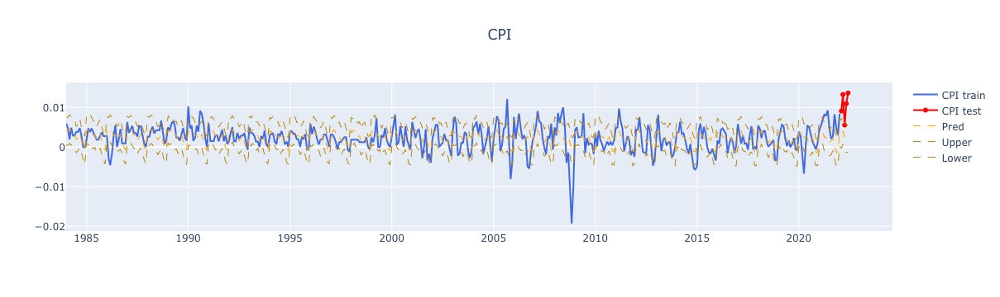

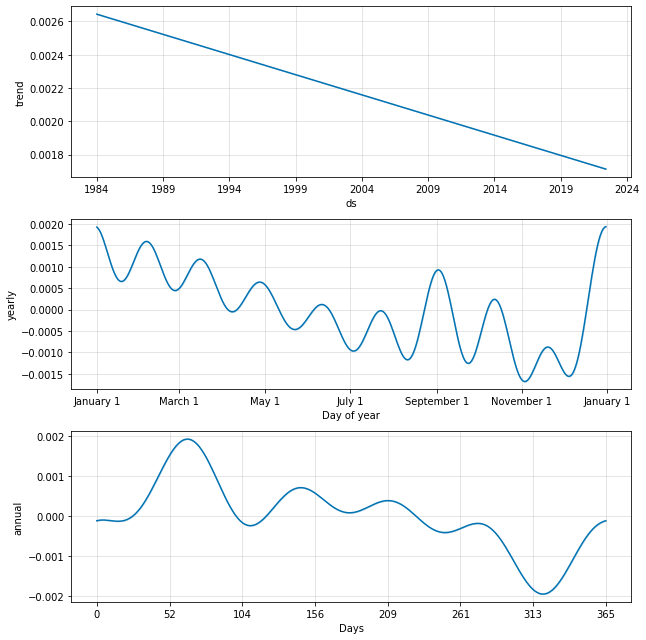

In [238]:
data_train, data_test, cpi, forecast, prophet = pred_prophet(cpi, 'log diff', 'M', 0.99, 0.015, 'annual', 365, 5)

fig = go.Figure()

fig.add_trace(go.Line(
    name="CPI train", x=data_train['ds'], y=data_train['y'],
    line=dict(color='royalblue', width=2)
))
fig.add_trace(go.Line(
    name="CPI test", x=data_test['ds'], y=data_test['y'],
    line=dict(color='red', width=2)
))
fig.add_trace(go.Line(
    name="Pred", x=cpi.index, y=cpi['pred_prophet'],
    line=dict(color='orange', width=1, dash='dash')
))
fig.add_trace(go.Line(
    name="Upper", x=cpi.index, y=cpi['pred_prophet_upper'],
    line=dict(color='darkgoldenrod', width=1, dash='dash')
))
fig.add_trace(go.Line(
    name="Lower", x=cpi.index, y=cpi['pred_prophet_lower'],
    line=dict(color='darkgoldenrod', width=1, dash='dash')    
))

fig.update_yaxes(showgrid=True)
fig.update_layout(
    title={'text': "CPI", 'y':0.9, 'x':0.5,'xanchor': 'center', 'yanchor': 'top'})
fig.show()

fig = prophet.plot_components(forecast)  
fig.show()  

In [239]:
print('Prophet RMSE:', rmse_eval(cpi, 'log diff', 'pred_prophet'))
print('Seasonal Naive RMSE:', rmse_table['pred_seasonal_naive'].loc['cpi_ld'])
print('Naive RMSE:', rmse_table['pred_naive'].loc['cpi_ld'])

Prophet RMSE: 0.002715351968806568
Seasonal Naive RMSE: 0.002877597418617507
Naive RMSE: 0.0032098212772588967


Another success! On log differenced CPI data, prophet substantially improves on the naive baseline. It also improves on the prior best prediction, the seasonal naive method.

In [240]:
# update RMSE table
rmse_table['pred_prophet'].loc['cpi_ld'] = rmse_eval(cpi, 'log diff', 'pred_prophet')

Prophet holds potential, but like all forecasting methods, it must be tested with a given dataset to see if it is a good fit. In addition, its claims cannot be taken at face value. Both of the above examples demonstrated that, even though prophet claims to be robust on non-stationary data, it only provided meaningful forecasts (better than a naive baseline) when presented with stationarized data. 

Having said that, when it came to raw Bitcoin price data, the upper and lower prediction bounds could provide useful trading indicators. More research and backtesting on this would be worthwhile.

While it's designed to detect and respond to trend changes, from a forecasting point of view, there is no silver bullet. Trends can change as circumstances change, and as with any time series analysis, it will be far more accurate in identifying past trends and behaviors than predicting future ones with any certainty!

# Results & Conclusions <a class="anchor" id="conclusions"></a>

Learnings and takeaways from individual models were noted in their respective sections. Here we will look at overarching themes and lessons learned. 

The final RMSE table is included here as a reminder of results demonstrated throughout.

In [242]:
rmse_table

,pred_naive,pred_seasonal_naive,pred_average,pred_diff_average,pred_ar,pred_arma,pred_arima,pred_sarima,pred_prophet
weather,4.039475,7.874659,16.766565,9.591262,NaN,NaN,NaN,NaN,NaN
cpi,0.728386,0.829263,5.705696,1.917254,NaN,NaN,NaN,NaN,NaN
sp500,74.707185,280.166728,108.176922,78.423174,NaN,NaN,66.447591,NaN,NaN
btc,5415.059705,8385.426295,17212.382431,6030.373596,NaN,NaN,NaN,NaN,NaN
housing,1.395923,12.491876,3.775471,0.9342,NaN,NaN,NaN,NaN,NaN
m2,70.360404,652.957376,184.240451,52.638454,NaN,NaN,NaN,NaN,NaN
weather_sa,4.039475,3.781317,3.017572,4.208143,3.986321,NaN,NaN,NaN,NaN
cpi_sa,1.192361,1.19214,5.705696,1.980834,NaN,NaN,NaN,NaN,NaN
sp500_sa,0.048303,0.057108,0.039888,0.053502,NaN,NaN,NaN,NaN,NaN
btc_sa,5041.810878,8106.659777,17746.030834,5618.867014,NaN,NaN,NaN,NaN,NaN


The primary takeaway is **test, test, test.** 

As is visible from the above, there are many blank values. The latter forecasting methods were generally only tested against 1 or 2 datasets. This was due to the fact that datasets must be tested for stationarity and autocorrelation individually before applying most of the above techniques. It would not have been appropriate to simply apply the same techniques, or crucially, the same parameters of a given model, across datasets. In fact, it could be argued the initial set of predictions, all of which were tested with the same parmaeters, should not have been generally tested. A lag period of 5 was applied to all of them, but no testing was done to determine if different lag periods produced better or worse results. This weakens any comparison against methods that were so tested.

This principle of testing was applied most thoroughly in the SARIMA section, where we went beyond evaluatiion via ADF tests and PACF plots, to automated testing of a range of parameters to determine the best ones.

The next takeaway is the importance of **decomposition into stationarity.**

Most models performed markedly better when provided with a stationary version of a dataset. The log difference form was generally used because it was not only stationary, but also turned multiplicative trending data into additive data. This allowed measuring of the RMSE across the dataset more accurately (although, admittedly, this was overlooked in a few of the examples in this project). 

The final takeaway is the importance of **updating models.**

In the regression section exploring historical stock data, we showed a change in the value predicted by a trendline fit to data through 1930 vs data through today. Models are only as good as the data they are given. Time series data will always, by definition, produce more data as time goes on. Therefore, any models must be updated and re-evaluated regularly. 

If a model is deployed, a common solution for this is simply to monitor drift and to automatically alert team members when it goes outside acceptable values. 

In [42]:
# Get word count
import json

with open('CW1.ipynb') as json_file:
    data = json.load(json_file)

words = 0
for cell in data['cells']:
    cellType = cell['cell_type']
    if cellType == "markdown":
        content = cell['source']
        for line in content:
            temp_list = [word for word in line.split() if "#" not in word] 
            words = words + len(temp_list)
            
print(words)

5519
